<h1 style="text-align:center;"> Automobile Price Prediction </h1>

Predicting automobile car prices, a research project that falls under the domain of machine learning and data science. The goal is to build a model that can accurately estimate the price of a car based on various features such as make, model, year of manufacturing, mileage, engine specifications, and more. 

https://www.kaggle.com/datasets/CooperUnion/cardataset/data

# Loading Libraries and Dataset

In [94]:
# Import Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler 
from sklearn.model_selection import GridSearchCV, train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score, mean_absolute_error, mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cross_decomposition import PLSRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.utils import shuffle 
%matplotlib inline 
import warnings
warnings.filterwarnings('ignore')

In [95]:
# Load the dataset
dt = pd.read_csv("C:\\Users\\HP\\Downloads\\data.csv\\data.csv")

In [96]:
# First 5 rows
dt.head()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


In [97]:
# Last 5 rows
dt.tail()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
11909,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,46120
11910,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,56670
11911,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50620
11912,Acura,ZDX,2013,premium unleaded (recommended),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50920
11913,Lincoln,Zephyr,2006,regular unleaded,221.0,6.0,AUTOMATIC,front wheel drive,4.0,Luxury,Midsize,Sedan,26,17,61,28995


In [98]:
# Shape of the data
dt.shape

(11914, 16)

In [99]:
# Information of the features
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11914 entries, 0 to 11913
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Make               11914 non-null  object 
 1   Model              11914 non-null  object 
 2   Year               11914 non-null  int64  
 3   Engine Fuel Type   11911 non-null  object 
 4   Engine HP          11845 non-null  float64
 5   Engine Cylinders   11884 non-null  float64
 6   Transmission Type  11914 non-null  object 
 7   Driven_Wheels      11914 non-null  object 
 8   Number of Doors    11908 non-null  float64
 9   Market Category    8172 non-null   object 
 10  Vehicle Size       11914 non-null  object 
 11  Vehicle Style      11914 non-null  object 
 12  highway MPG        11914 non-null  int64  
 13  city mpg           11914 non-null  int64  
 14  Popularity         11914 non-null  int64  
 15  MSRP               11914 non-null  int64  
dtypes: float64(3), int64(5

# Data Cleaning and Preprocessing

In [100]:
# Cloning the data
df = dt.copy()

In [101]:
df.head(3)

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350


In [102]:
# Statistical description of data
df.describe()

,Year,Engine HP,Engine Cylinders,Number of Doors,highway MPG,city mpg,Popularity,MSRP
count,11914.000000,11845.00000,11884.000000,11908.000000,11914.000000,11914.000000,11914.000000,1.191400e+04
mean,2010.384338,249.38607,5.628829,3.436093,26.637485,19.733255,1554.911197,4.059474e+04
std,7.579740,109.19187,1.780559,0.881315,8.863001,8.987798,1441.855347,6.010910e+04
min,1990.000000,55.00000,0.000000,2.000000,12.000000,7.000000,2.000000,2.000000e+03
25%,2007.000000,170.00000,4.000000,2.000000,22.000000,16.000000,549.000000,2.100000e+04
50%,2015.000000,227.00000,6.000000,4.000000,26.000000,18.000000,1385.000000,2.999500e+04
75%,2016.000000,300.00000,6.000000,4.000000,30.000000,22.000000,2009.000000,4.223125e+04
max,2017.000000,1001.00000,16.000000,4.000000,354.000000,137.000000,5657.000000,2.065902e+06


- Year: The minimum year in dataset is 1990, average year is 2010 and maximum year is 2017.
- Engine Hp:: The minimum hp in dataset is 55, average hp is 249 and maximum hp is 1001.
- Engine Cylinders: The minimum cylinders in dataset are 0, average cylinders are 5 and maximum cylindes are 16.
- Number of doors: The minimum doors a car have are 2, on average, the number of doors are 3 and maximum doors are 4.
- Highway mpg: The minimum highway mpg in dataset is 12, average highway mpg is 26.6 and maximum highway mpg is 354.
- City mpg: The minimum city mpg in dataset is 7, average city mpg is 19.7 and maximum city mpg is 137.
- Popularity: The minimum popularity of a car in dataset is 2, average car popularity is 1554.9 and maximum car popularity is 5657.
- Price: The minimum car price in dataset is 2000, average car price is 40K and maximum car price is 2.06 million.

In [103]:
# Duplicate values
df.duplicated().sum()

715

In [104]:
# Dropping the Duplicate values
df = df.drop_duplicates()

In [105]:
df.shape

(11199, 16)

In [106]:
# Missing values
print('Number of missing values :')
df.isnull().sum()

Number of missing values :


Make                    0
Model                   0
Year                    0
Engine Fuel Type        3
Engine HP              69
Engine Cylinders       30
Transmission Type       0
Driven_Wheels           0
Number of Doors         6
Market Category      3376
Vehicle Size            0
Vehicle Style           0
highway MPG             0
city mpg                0
Popularity              0
MSRP                    0
dtype: int64

Let's drop the market column as it contains too much of the null values and also this feature doesn't have high importance regarding target feature which is price

In [107]:
# Dropping irrelevant feature
df.drop('Market Category', axis = 1, inplace = True)

In [108]:
# Filling the missing values
df['Engine Fuel Type'] = df['Engine Fuel Type'].fillna('regular unleaded')
df['Engine HP'] = df['Engine HP'].fillna(0)
df['Engine Cylinders'] = df['Engine Cylinders'].fillna(0)
df['Number of Doors'] = df['Number of Doors'].fillna(df['Number of Doors'].mean())

In [109]:
# Renaming the columns
df.rename(columns={'year' : 'Year', 'model' : 'Model', 'make' : 'Make', 'Engine Fuel Type' : 'Fuel',
                   'Engine HP' : 'HP', 'Engine Cylinders' : 'Cylinders', 'Transmission Type' : 'Transmission', 
                   'Driven_Wheels' : 'Drive', 'Number of Doors' : 'Doors', 'Vehicle Size' : 'Size', 
                   'Vehicle Style' : 'Style', 'highway MPG' : 'Highway MPG', 'city mpg' : 'City MPG', 'MSRP' : 'Price'}, inplace = True)

Seperate the numerical column and categorical column

In [110]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11199 entries, 0 to 11913
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Make          11199 non-null  object 
 1   Model         11199 non-null  object 
 2   Year          11199 non-null  int64  
 3   Fuel          11199 non-null  object 
 4   HP            11199 non-null  float64
 5   Cylinders     11199 non-null  float64
 6   Transmission  11199 non-null  object 
 7   Drive         11199 non-null  object 
 8   Doors         11199 non-null  float64
 9   Size          11199 non-null  object 
 10  Style         11199 non-null  object 
 11  Highway MPG   11199 non-null  int64  
 12  City MPG      11199 non-null  int64  
 13  Popularity    11199 non-null  int64  
 14  Price         11199 non-null  int64  
dtypes: float64(3), int64(5), object(7)
memory usage: 1.4+ MB


In [111]:
# Seperating categorical and numerical features
num_col = df.select_dtypes(include = [np.number])
cat_col = df.select_dtypes(exclude = [np.number])

In [112]:
# Unique values of the features
for col in cat_col:
    print(col)
    print(df[col].unique())
    print(df[col].nunique())
    print('\n', "======================================", '\n')

Make
['BMW' 'Audi' 'FIAT' 'Mercedes-Benz' 'Chrysler' 'Nissan' 'Volvo' 'Mazda'
 'Mitsubishi' 'Ferrari' 'Alfa Romeo' 'Toyota' 'McLaren' 'Maybach'
 'Pontiac' 'Porsche' 'Saab' 'GMC' 'Hyundai' 'Plymouth' 'Honda'
 'Oldsmobile' 'Suzuki' 'Ford' 'Cadillac' 'Kia' 'Bentley' 'Chevrolet'
 'Dodge' 'Lamborghini' 'Lincoln' 'Subaru' 'Volkswagen' 'Spyker' 'Buick'
 'Acura' 'Rolls-Royce' 'Maserati' 'Lexus' 'Aston Martin' 'Land Rover'
 'Lotus' 'Infiniti' 'Scion' 'Genesis' 'HUMMER' 'Tesla' 'Bugatti']
48


Model
['1 Series M' '1 Series' '100' '124 Spider' '190-Class' '2 Series' '200'
 '200SX' '240SX' '240' '2' '3 Series Gran Turismo' '3 Series' '300-Class'
 '3000GT' '300' '300M' '300ZX' '323' '350-Class' '350Z' '360' '370Z' '3'
 '4 Series Gran Coupe' '4 Series' '400-Class' '420-Class' '456M'
 '458 Italia' '4C' '4Runner' '5 Series Gran Turismo' '5 Series'
 '500-Class' '500e' '500' '500L' '500X' '550' '560-Class' '570S' '575M'
 '57' '599' '5' '6 Series Gran Coupe' '6 Series' '600-Class' '6000'
 '612 Scaglietti

The transmission columns has a value 'UNKNOWN' which is clearly an anomoly. So I'll drop all of those cars who's transmission is UNKNOWN.

In [113]:
# Transmission value counts
df['Transmission'].value_counts()

Transmission
AUTOMATIC           7932
MANUAL              2634
AUTOMATED_MANUAL     553
DIRECT_DRIVE          68
UNKNOWN               12
Name: count, dtype: int64

In [114]:
# Dropping 'Unknown' value from the feature
df.drop(df[df['Transmission']=='UNKNOWN'].index, axis='index', inplace = True)

In [115]:
df.shape

(11187, 15)

# Exploratory Data Analysis

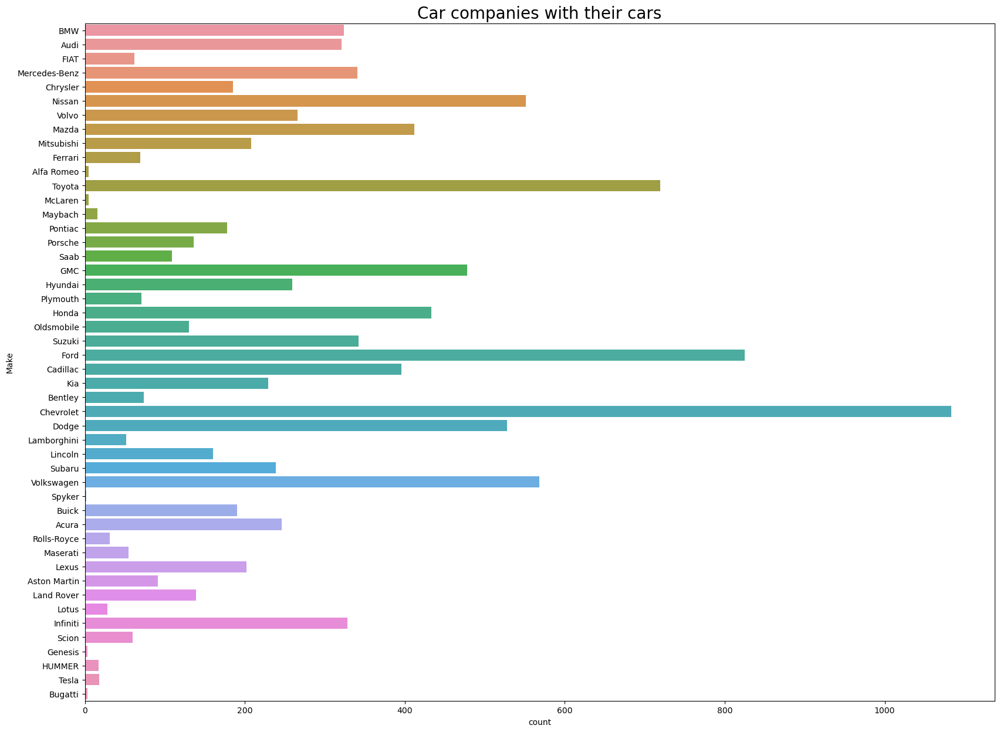

In [116]:
# Bar Plot Distribution 
plt.figure(figsize = (20, 15))
sns.countplot(y = df.Make)
plt.title("Car companies with their cars", fontsize = 20)
plt.show()

Chevrolet manufacturer has the highest number of cars. On the other hand, there are manufacturers such as Bugatti and Genesis that don’t usually have a large number of cars.

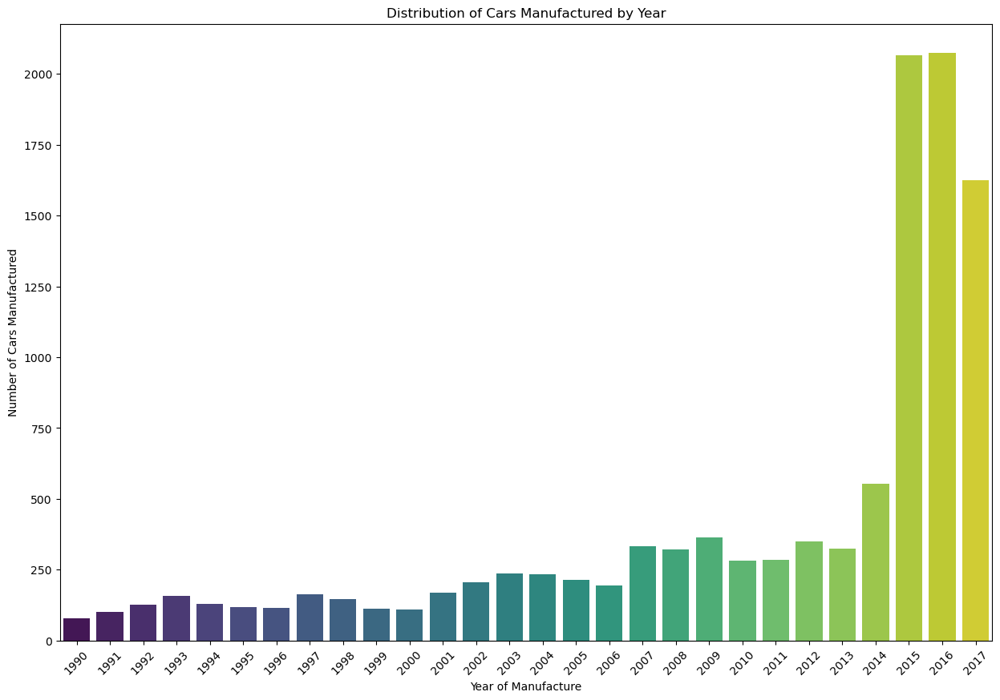

In [117]:
# Count plot Distribution
plt.figure(figsize = (15, 10))
sns.countplot(x=df['Year'], palette="viridis")

plt.xlabel('Year of Manufacture')
plt.ylabel('Number of Cars Manufactured')
plt.title('Distribution of Cars Manufactured by Year')

plt.xticks(rotation=45)
plt.show()

Data accounts for the most recent cars without having a lot of cars that are quite old. This is good as our data accounts for the most recent prices of the cars rather than relying on the significantly past data.

<Axes: xlabel='Size', ylabel='count'>

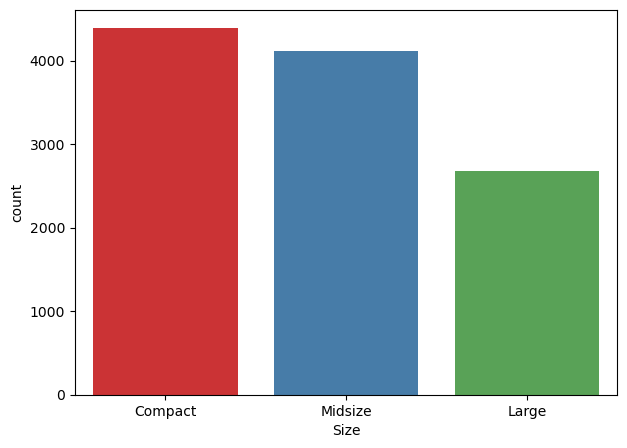

In [118]:
# Category Distribution
plt.figure(figsize = (7, 5))
sns.countplot(x = 'Size', data = df, palette = 'Set1')

Compact cars are more in number compared those categories such as midsize and large segments. This is also reflective of the real-world where most of the cars are compact or midsize compared to a few models that are large in number. Therefore, the data is quite reflective of the real-world so that accurate predictions could be made on the test set.



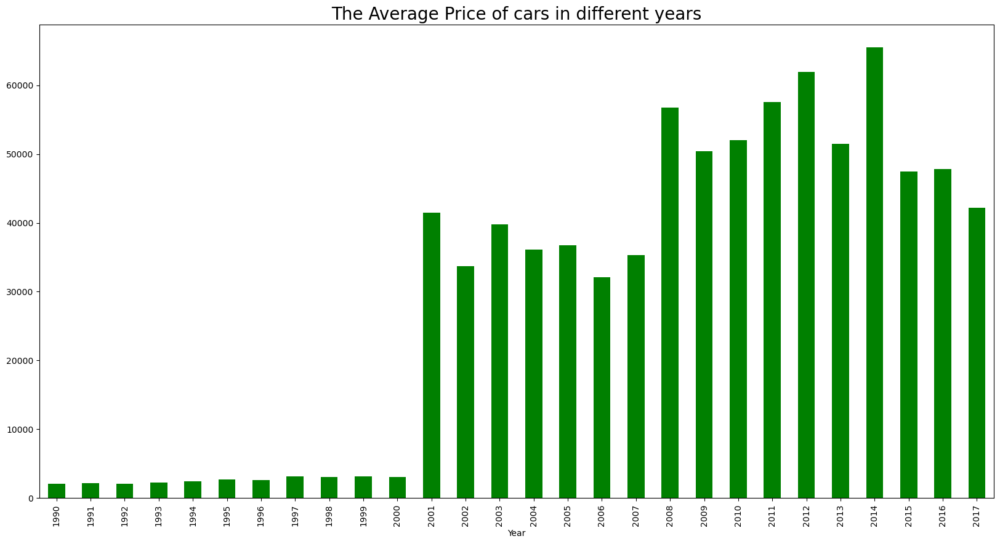

In [119]:
# Average price Distribution
plt.figure(figsize = (20, 10))
df.groupby('Year')['Price'].mean().plot(kind = 'bar', color = 'g')
plt.title("The Average Price of cars in different years", fontsize = 20)
plt.show()

We have grouped the cars based on the years of manufacture and then took the average price of the cars after grouping them. We see that as the years progress, there is a steady average increase in the prices of cars from the data respectively.

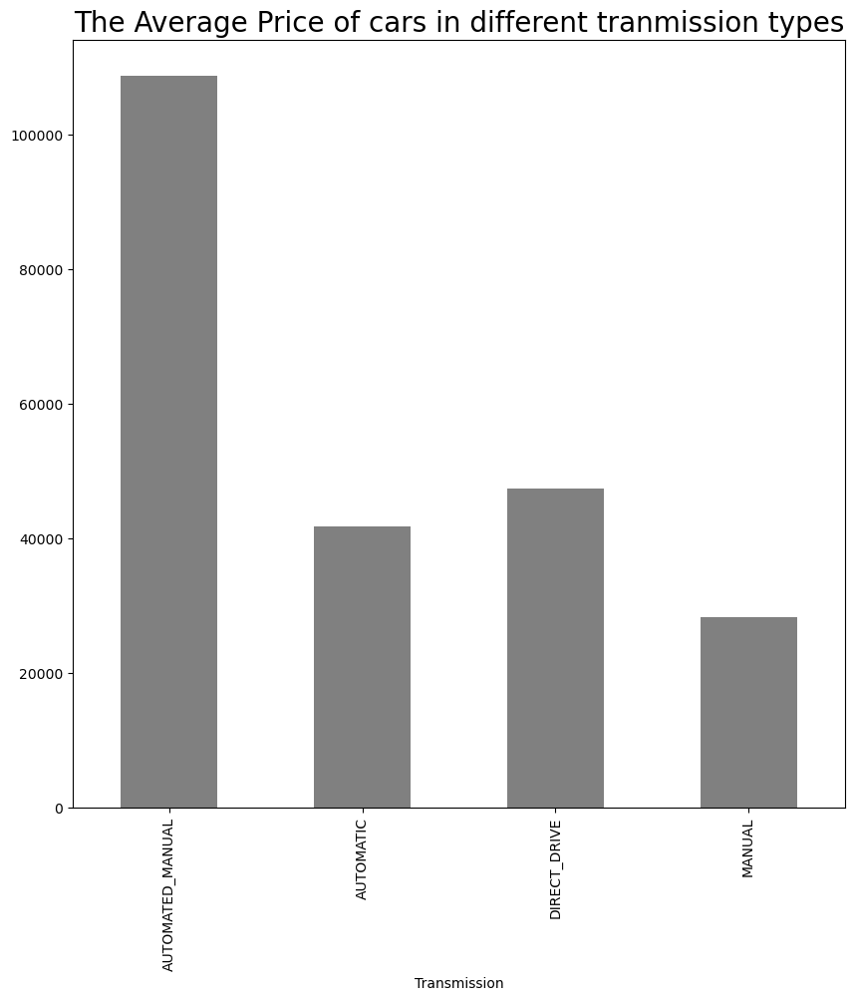

In [120]:
plt.figure(figsize = (10, 10))
df.groupby('Transmission')['Price'].mean().plot(kind = 'bar', color = 'grey')
plt.title("The Average Price of cars in different tranmission types", fontsize = 20)
plt.show()

Cars that are both automatic and manual are considerably higher in terms of prices compared to the others. Usually manual cars cost less compared to their automatic counterparts.

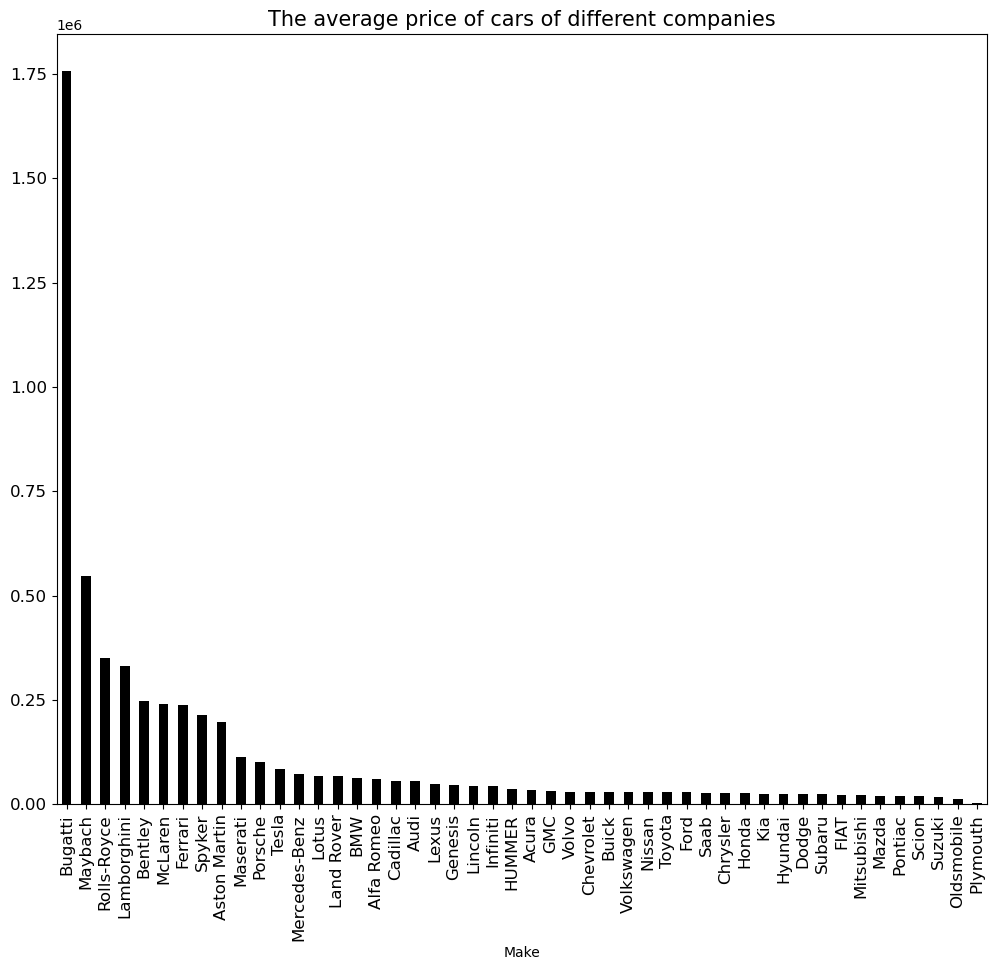

In [121]:
plt.figure(figsize = (12, 10))
df.groupby(['Make'])['Price'].mean().sort_values(ascending = False).plot(kind = 'bar', fontsize = 12, color = 'black')
plt.title("The average price of cars of different companies", fontsize = 15)
plt.show()

 The manufacturer ‘Bugatti’ has significantly higher prices than other manufacturers combined. Other companies that are close to the price range of Bugatti manufacturers include Maybach, Rolls-Royce, and Lamborghini.

In [122]:
# Correlation of numerical features
num_col.corr()

,Year,HP,Cylinders,Doors,Highway MPG,City MPG,Popularity,Price
Year,1.000000,0.322704,-0.033038,0.247543,0.244972,0.188417,0.085874,0.209635
HP,0.322704,1.000000,0.782957,-0.133685,-0.424600,-0.432195,0.035922,0.646779
Cylinders,-0.033038,0.782957,1.000000,-0.150693,-0.610338,-0.585333,0.043010,0.533431
Doors,0.247543,-0.133685,-0.150693,1.000000,0.112764,0.118697,-0.057233,-0.144794
Highway MPG,0.244972,-0.424600,-0.610338,0.112764,1.000000,0.886299,-0.017159,-0.166631
City MPG,0.188417,-0.432195,-0.585333,0.118697,0.886299,1.000000,-0.000549,-0.162343
Popularity,0.085874,0.035922,0.043010,-0.057233,-0.017159,-0.000549,1.000000,-0.048371
Price,0.209635,0.646779,0.533431,-0.144794,-0.166631,-0.162343,-0.048371,1.000000


- The ‘City MPG’ and ‘Highway MPG’ are quite correlated to each other with a correlation coefficient being equal to 0.89. Similarly, the features ‘Engine Cylinders’ and ‘Engine HP’ are also related. All the remaining features seem to be related in a negative way or uncorrelated.
- It is important to note that the values of the correlation coefficient lie between the range -1 to 1 respectively. The higher the positive correlation between the features, the more would be correlation coefficient value would move to 1. The higher the negative correlation between the features, the more would the correlation coefficient value move to -1 respectively.

In [123]:
df.isnull().sum()

Make            0
Model           0
Year            0
Fuel            0
HP              0
Cylinders       0
Transmission    0
Drive           0
Doors           0
Size            0
Style           0
Highway MPG     0
City MPG        0
Popularity      0
Price           0
dtype: int64

In [124]:
df.duplicated().sum()

5

In [125]:
df.drop_duplicates()

,Make,Model,Year,Fuel,HP,Cylinders,Transmission,Drive,Doors,Size,Style,Highway MPG,City MPG,Popularity,Price
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11909,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,46120
11910,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,56670
11911,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,50620
11912,Acura,ZDX,2013,premium unleaded (recommended),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,50920


# Handling Outliers

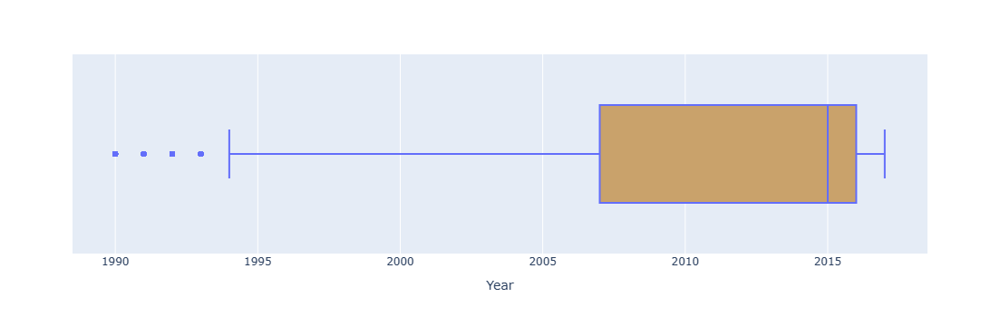

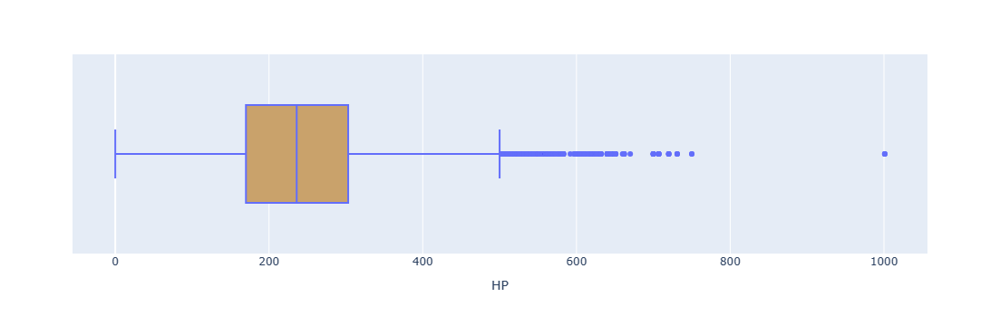

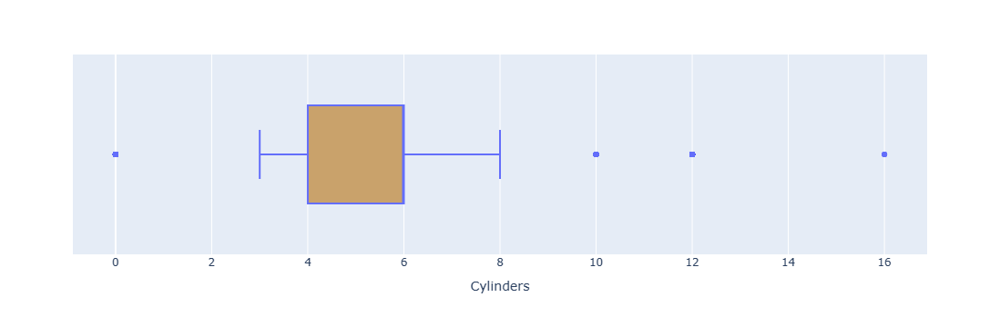

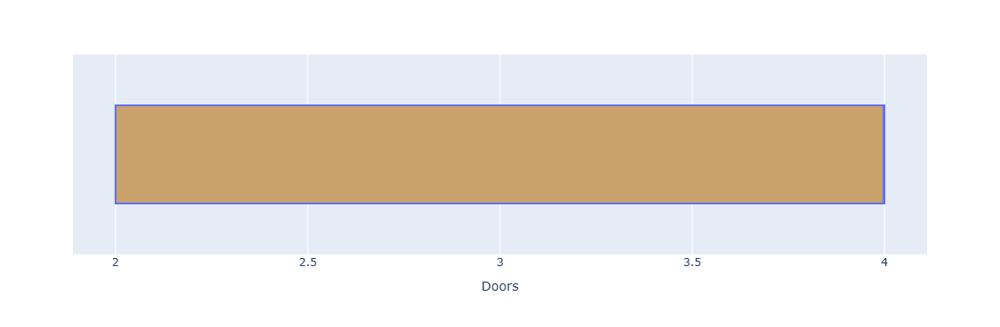

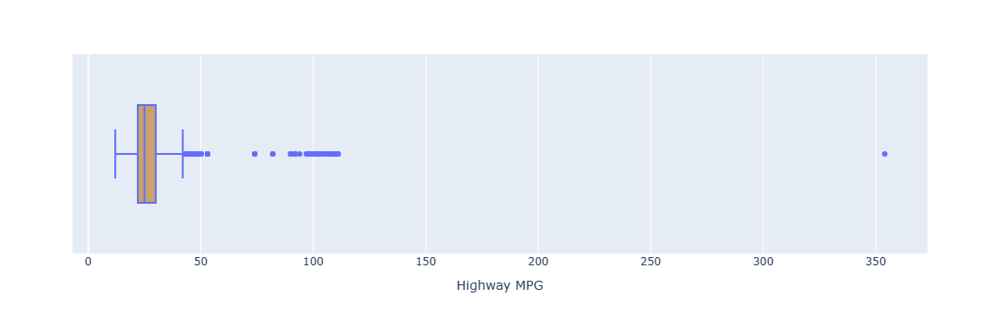

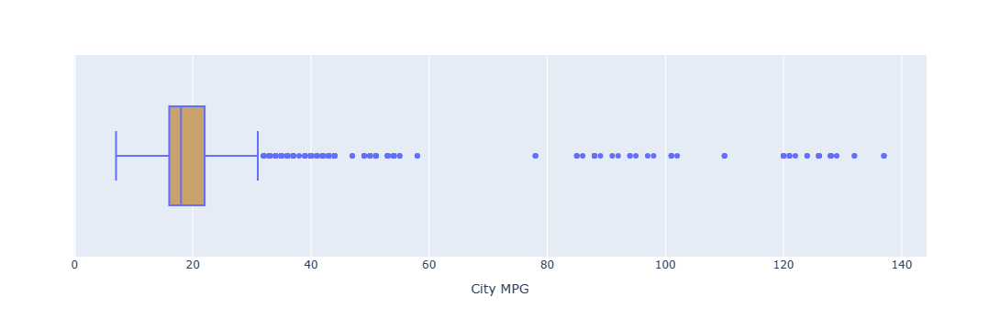

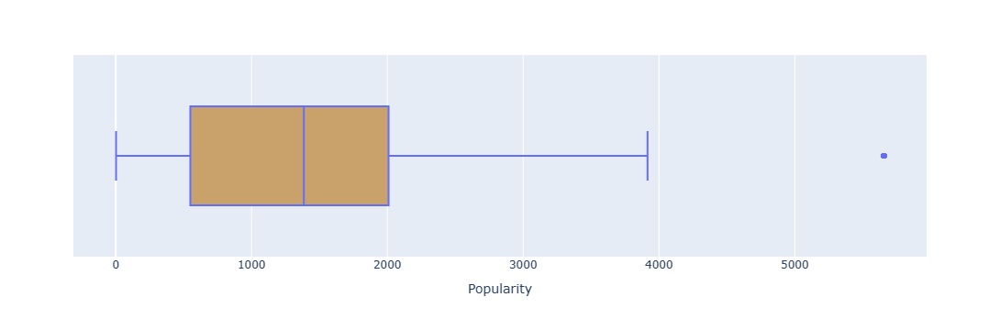

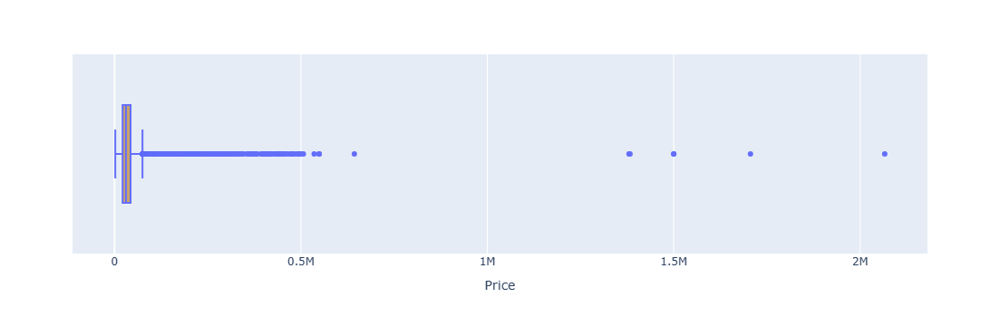

In [126]:
# Box Plot Distribution for Outlier detection
for i in num_col:
    fig = px.box(df, x = df[i])
    fig.update_traces(fillcolor = '#C9A26B')
    fig.show()

- HP: Any Hp above than 500 is an outlier.
- Cylinders: Cylinders above than 8 and lower than 3 are outliers.
- Highway MPG: Any highway mpg below than 12 and higher than 42 is as an outlier.
- City MPG: Any city mpg below than 7 and higher than 31 is as an outlier.
- Price: Car prices lower than 2000 and upper than 70.9K is an outlier.

Deleting the outliers below by dropping them from the original dataset.

In [127]:
# Deletion of Outliers 
s1 = df.shape
clean = df[['HP', 'Cylinders', 'Highway MPG', 'City MPG', 'Price']]
for i in clean.columns:
    qt1 = df[i].quantile(0.25)
    qt3 = df[i].quantile(0.75)
    iqr = qt3 - qt1
    lower = qt1-(1.5*iqr)
    upper = qt3+(1.5*iqr)
    min_in = df[df[i]<lower].index
    max_in = df[df[i]>upper].index
    df.drop(min_in, inplace = True)
    df.drop(max_in, inplace = True)
s2 = df.shape
outliers = s1[0] - s2[0]
print("Deleted outliers are : ", outliers)


Deleted outliers are :  1403


In [128]:
df.shape

(9784, 15)

Checking the changes after outliers deletion from a dataset column by plotting the boxplot again

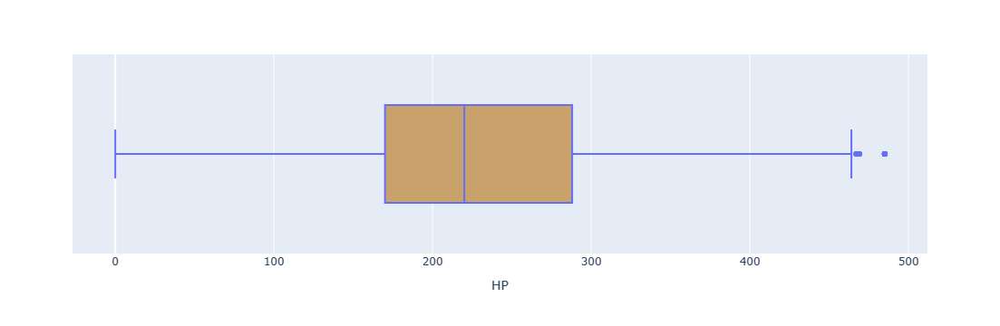

In [129]:
fig = px.box(df, x = df['HP'])
fig.update_traces(fillcolor = '#C9A26B')

In [130]:
# Statistical Description
df.describe()

,Year,HP,Cylinders,Doors,Highway MPG,City MPG,Popularity,Price
count,9784.00000,9784.000000,9784.000000,9784.000000,9784.000000,9784.000000,9784.000000,9784.000000
mean,2010.31204,231.154334,5.424162,3.505110,26.304374,19.180192,1560.331664,29204.537612
std,7.46610,78.693348,1.395065,0.841754,5.745849,4.376362,1464.248520,15605.472026
min,1990.00000,0.000000,3.000000,2.000000,12.000000,10.000000,21.000000,2000.000000
25%,2006.00000,170.000000,4.000000,3.000000,22.000000,16.000000,549.000000,20498.000000
50%,2014.00000,220.000000,6.000000,4.000000,26.000000,18.000000,1385.000000,29089.000000
75%,2016.00000,288.000000,6.000000,4.000000,30.000000,22.000000,2009.000000,38850.000000
max,2017.00000,485.000000,8.000000,4.000000,42.000000,31.000000,5657.000000,70900.000000


- HP: The minimum hp in dataset after outlier deletion is 0, average hp is 231 and maximum hp i485.    
- Cylinders: The minimum cylinders in dataset after outlier deletion are 3, average cylinders are 5 and maximum cylindes are 8.    
- Highway MPG: The minimum highway mpg in dataset after outlier deletion is 12, average highway mpg is 26.3 and maximum highway mpg is 42.  
- City MPG: The minimum city mpg in dataset after outlier deletion is 10, average city mpg is 19.1 and maximum city mpg is 31.    
- Price: The minimum car price in dataset after outlier deletion is 2000, average car price is around 29K and maximum car price is 70.9K.

# Univariate Analysis

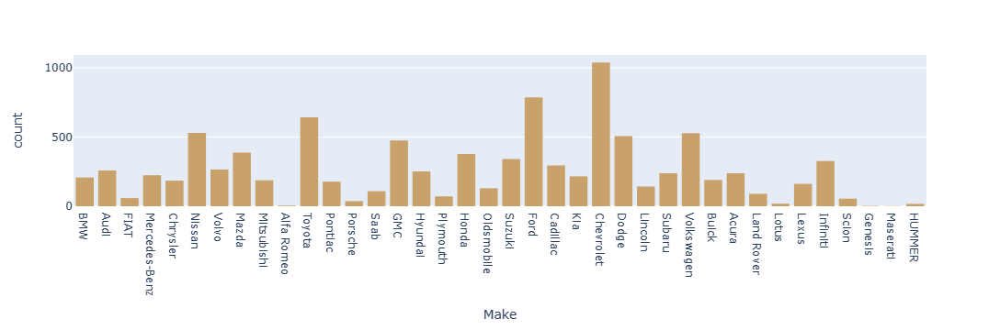

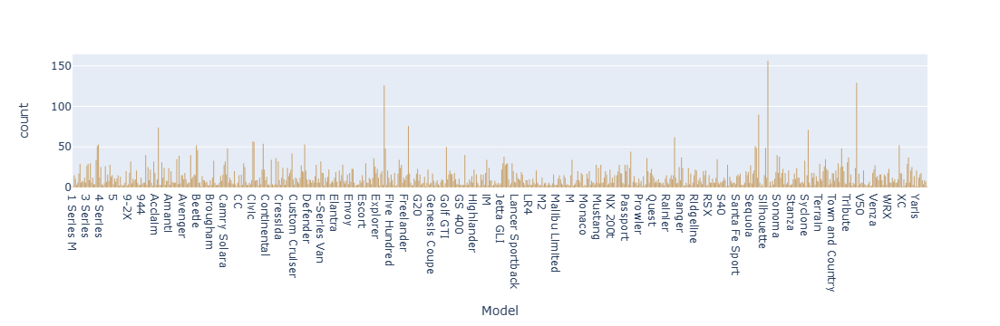

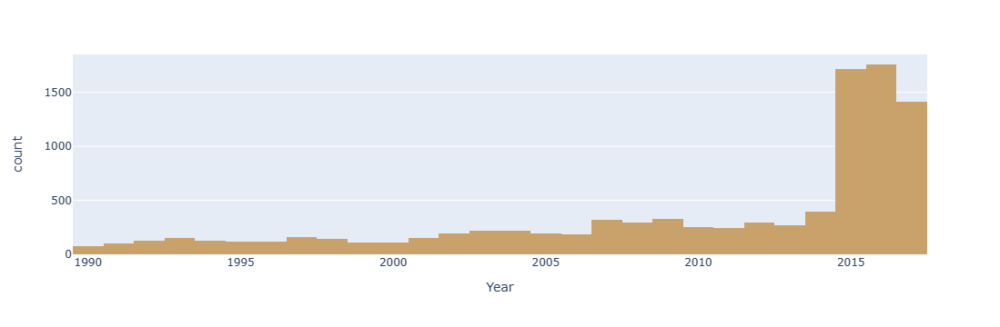

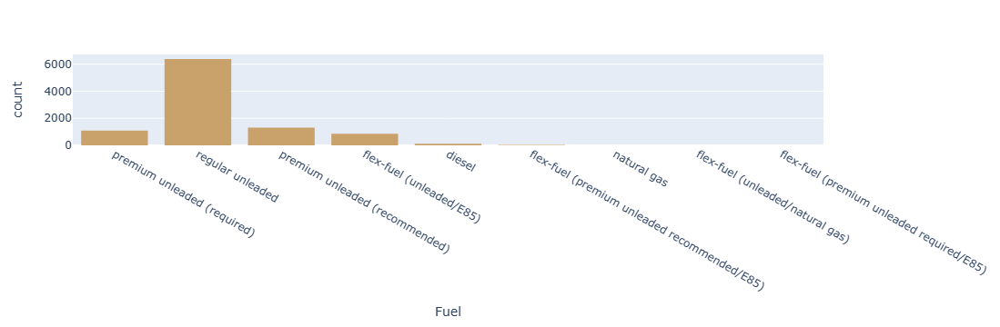

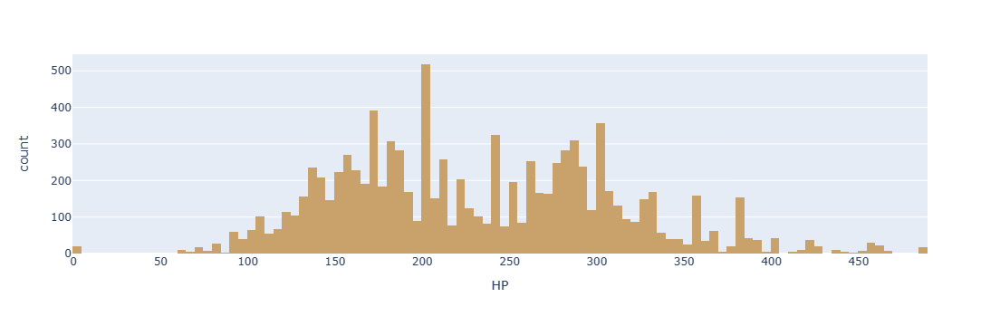

...

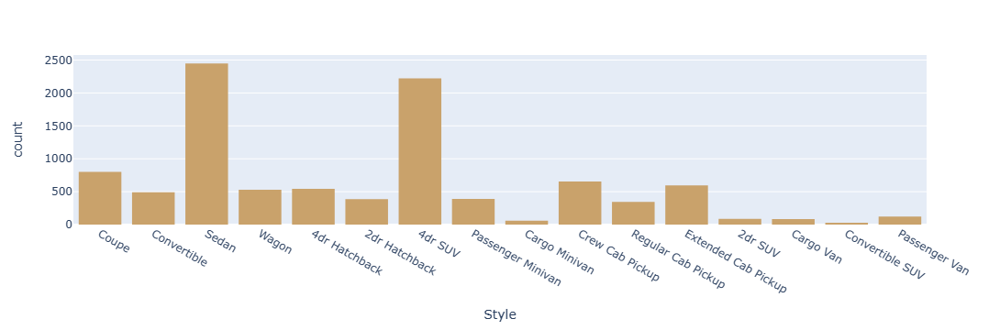

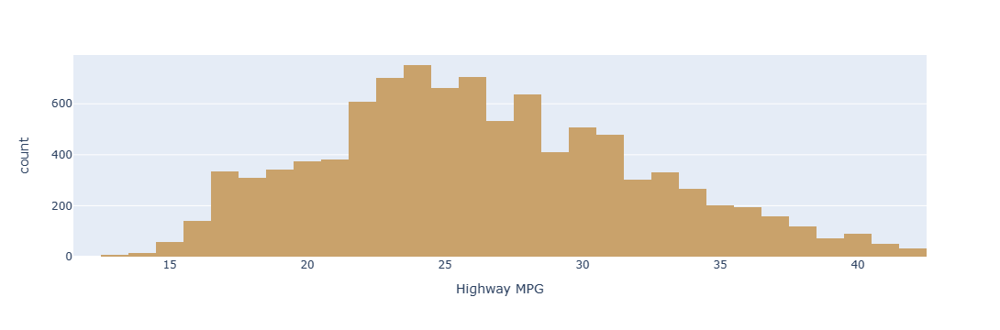

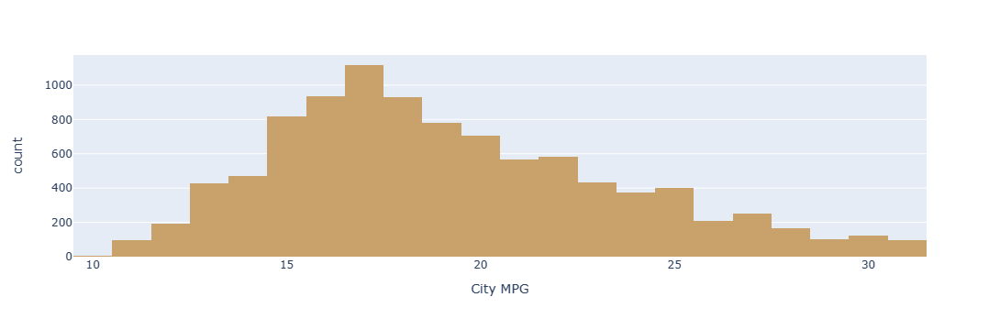

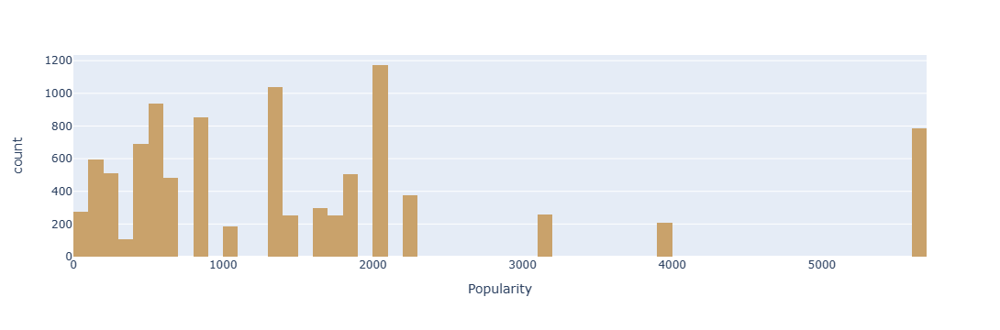

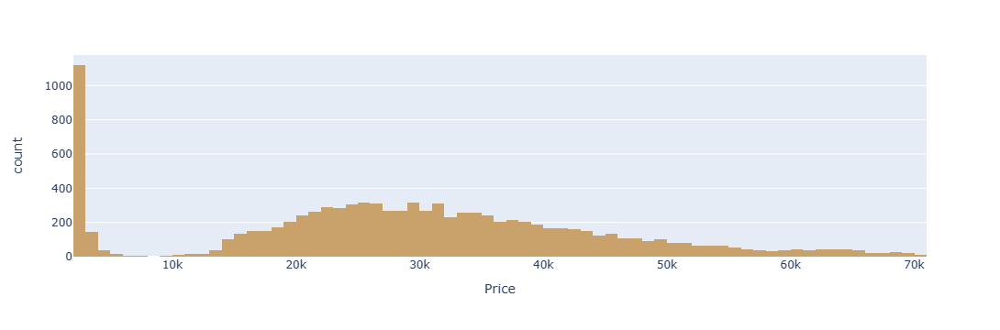

In [131]:
# Distribution of Features
for i in df:
    fig = px.histogram(df, x= i, color_discrete_sequence = ['#C9A26B'])
    fig.show()

- Make: Least count: Maserati (2), Maximum count: Chevrolet (1039).
- Model: Least count: Many models (1), Maximum count: Silverado 1500 (156).
- Year: Least count 1990 (76): , Maximum count: 2016 (1756).
- Fuel: Least count: Natural Gas (2), Maximum count: Regular Unleaded (6380).
- HP: Least count: Many hps (1), Maximum count: 200 (355).
- Cylinders: Least count: 3 (11), Maximum count: 4 (4110).
- Transmission: Least count: Automated Manual (316), Maximum count: Automatic (7097).
- Drive: Least count: four wheel drive (1220), Maximum count: front wheel drive (4056).
- Doors: Least count: 3 (356), Maximum count: 4 (7185).
- Size:: Least count: Large (2241), Maximum count: Compact (3822).
- Style:: Least count: Convertible SUV (28), Maximum count: Sedan (2448).
- Highway MPG: Least count: 12 (1), Maximum count: 24 (752).
- City MPG: Least count: 10 (5), Maximum count: 17 (1117).
- Popularity: Least count: 238 (2), Maximum count: 1385 (1039).
- Price: Least count: Many prices (1), Maximum count: 2000 (736).

# Bivariate Analysis

According to HP

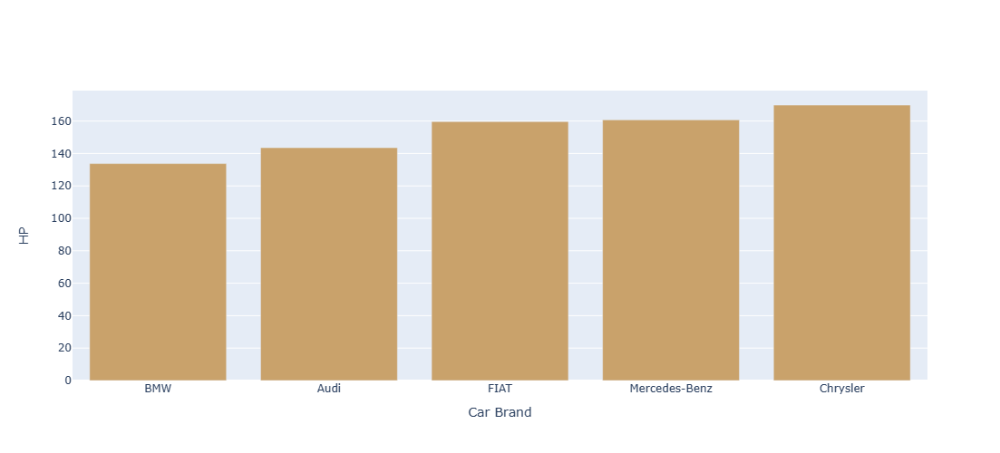

In [132]:
# Distribution of Feature w.r.t. to other feature
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Make'].unique(), y = df.groupby('Make')['HP'].mean().sort_values()[:5], marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Brand", yaxis_title = "HP", width = 700, height = 500)

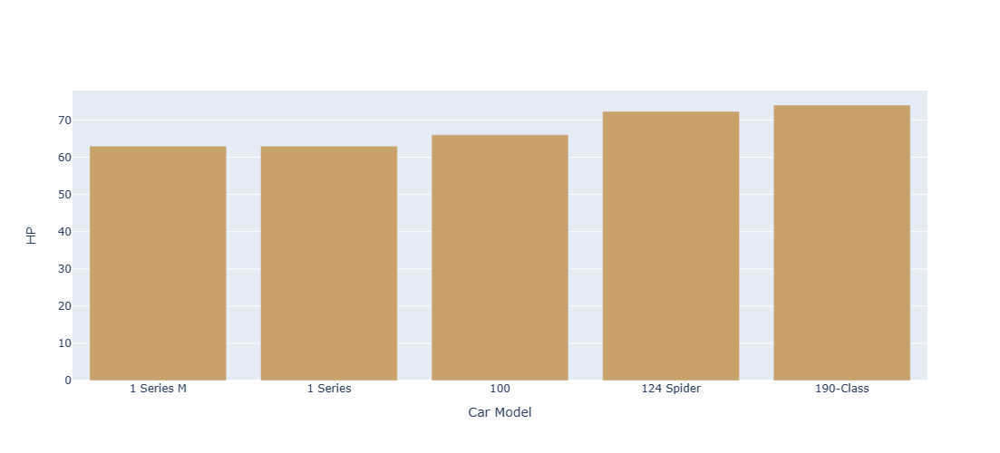

In [133]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Model'].unique(), y = df.groupby('Model')['HP'].mean().sort_values()[:5], marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Model", yaxis_title = "HP", width = 700, height = 500)

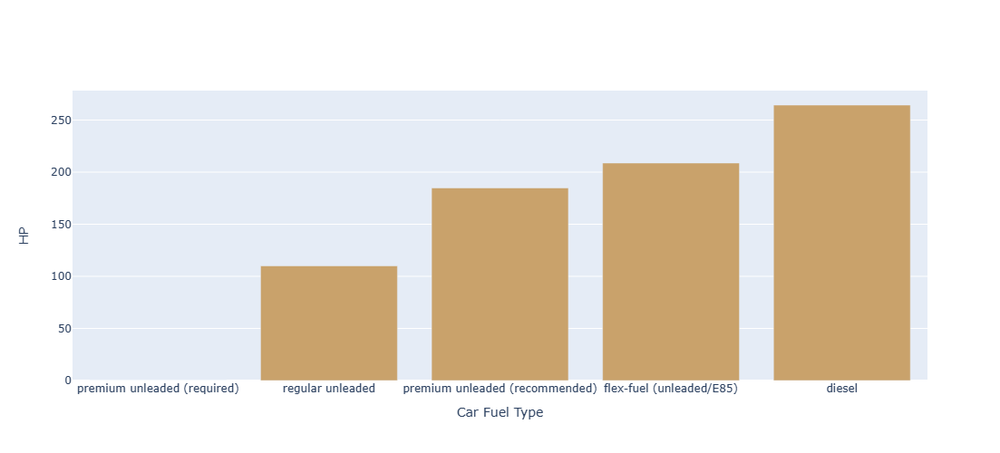

In [134]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Fuel'].unique(), y = df.groupby(['Fuel'])['HP'].mean().sort_values()[:5], marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Fuel Type", yaxis_title = "HP", width = 700, height = 500)

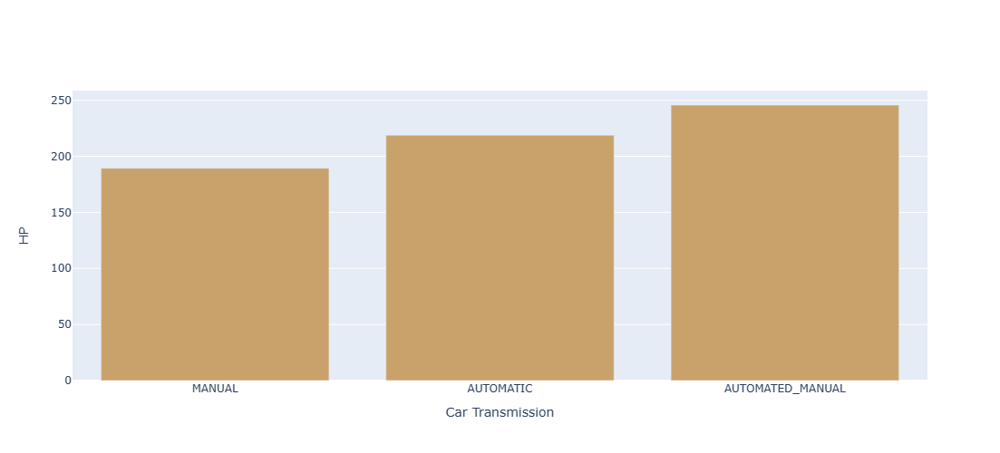

In [135]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Transmission'].unique(), y = df.groupby('Transmission')['HP'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Transmission", yaxis_title = "HP", width = 700, height = 500)

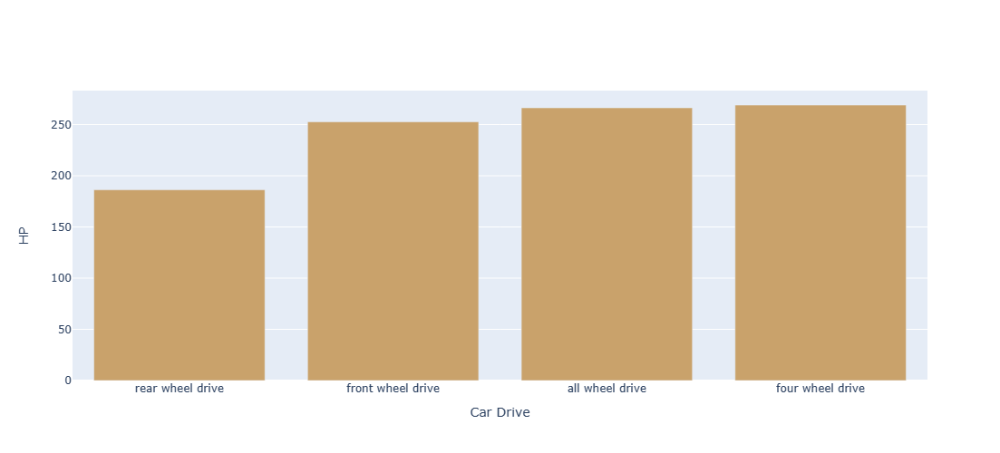

In [136]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Drive'].unique(), y = df.groupby('Drive')['HP'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Drive", yaxis_title = "HP", width = 700, height = 500)

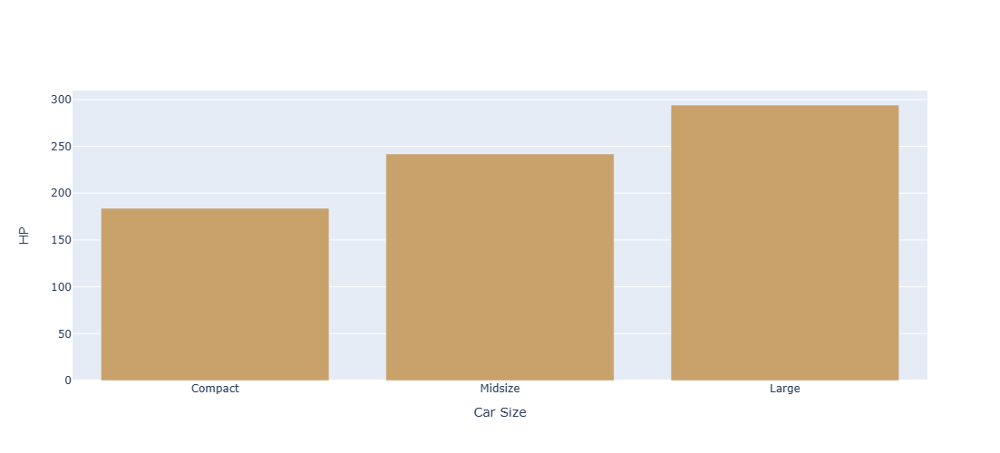

In [137]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Size'].unique(), y = df.groupby('Size')['HP'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Size", yaxis_title = "HP", width = 700, height = 500)

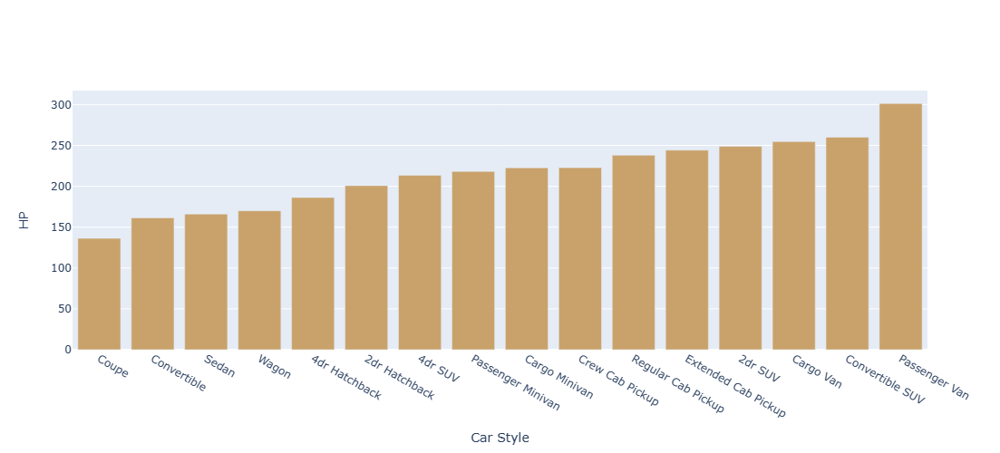

In [138]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Style'].unique(), y = df.groupby('Style')['HP'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Style", yaxis_title = "HP", width = 700, height = 500)

- Make: The car brand of Chrysler has the highest Hp of 169.8.
- Model: The car model of 190-Class has the highest Hp of 74.    
- Fuel: The car fuel type of Diesel has the highest Hp of 264.3.
- Transmission: Car transmission of Manual has the lowest Hp of 189.2 and car transmission of Automated-Manual has the highest hp of 245.6.
- Drive: Car drive of Rear wheel drive has the lowest Hp of 186.2 and car drive of Four wheel drive has the highest hp of 269.    
- Size: Car size of Compact has the lowest Hp of 183.8 and car size of Large has the highest hp of 294.
- Style: Car style of Coupe has the lowest Hp of 136.2 and car style of Passenger Van has the highest hp of 301.2.

According to City MPG

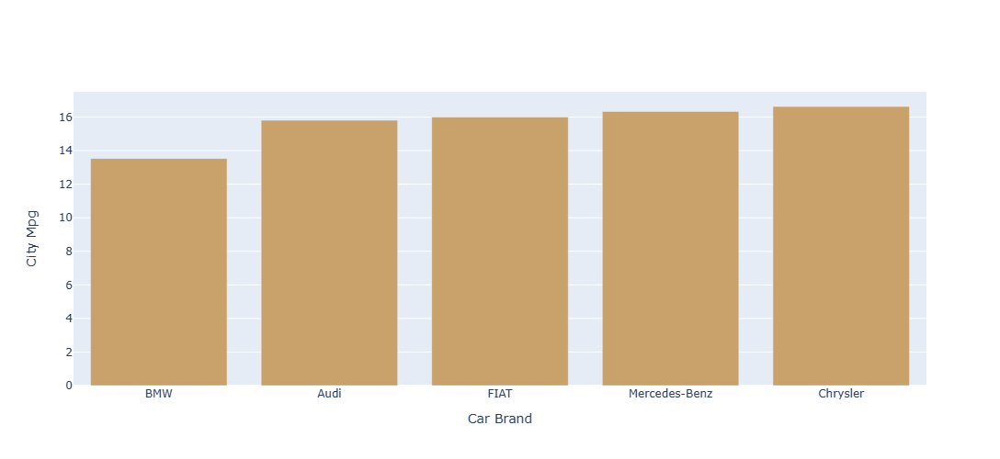

In [139]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Make'].unique(), y = df.groupby('Make')['City MPG'].mean().sort_values()[:5], marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Brand", yaxis_title = "City Mpg", width = 700, height = 500 )

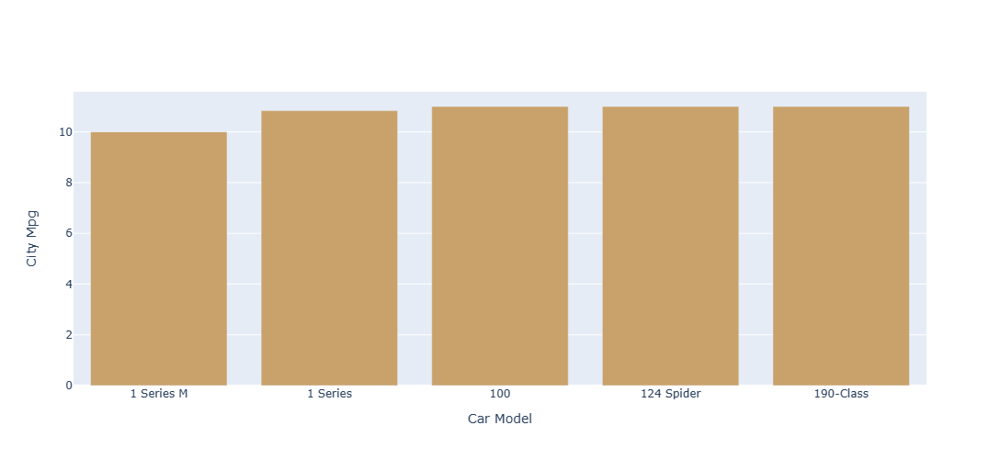

In [140]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Model'].unique(), y = df.groupby('Model')['City MPG'].mean().sort_values()[:5], marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Model", yaxis_title = "City Mpg", width = 700, height = 500)

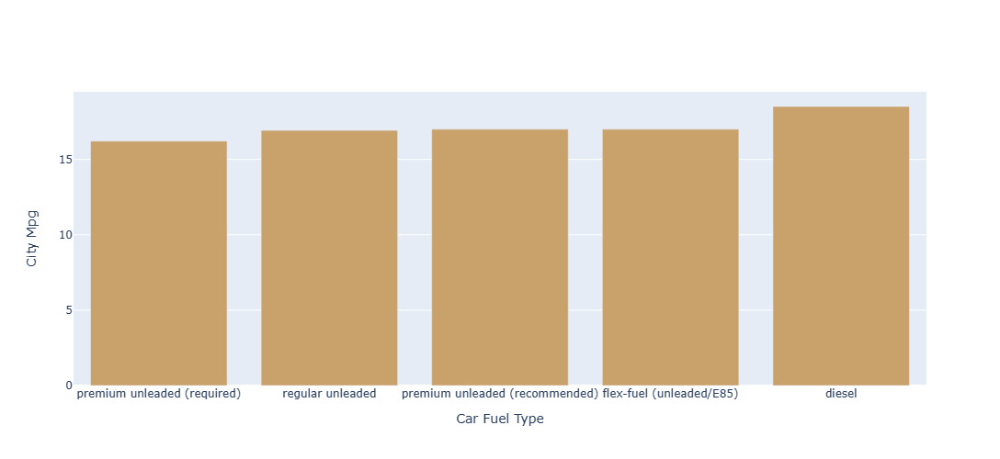

In [141]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Fuel'].unique(), y = df.groupby('Fuel')['City MPG'].mean().sort_values()[:5], marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Fuel Type", yaxis_title = "City Mpg", width = 700, height = 500)

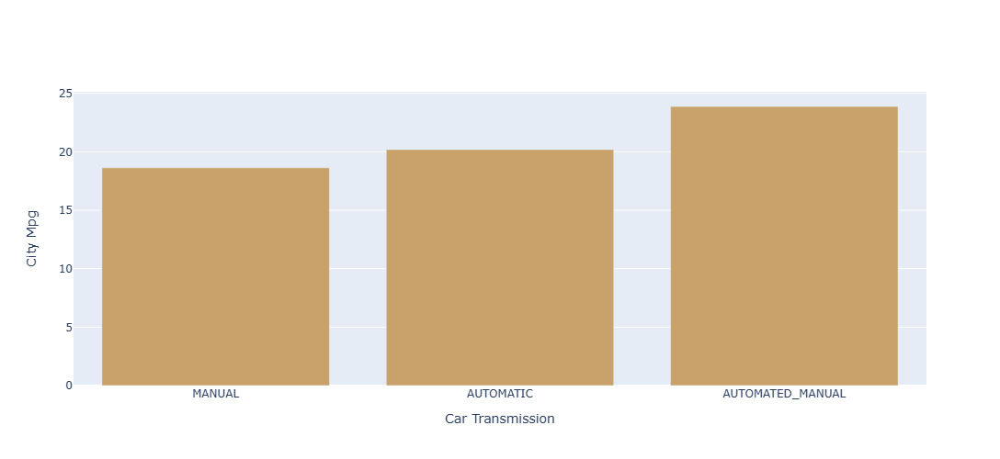

In [142]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Transmission'].unique(), y = df.groupby('Transmission')['City MPG'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Transmission", yaxis_title = "City Mpg", width = 700, height = 500)

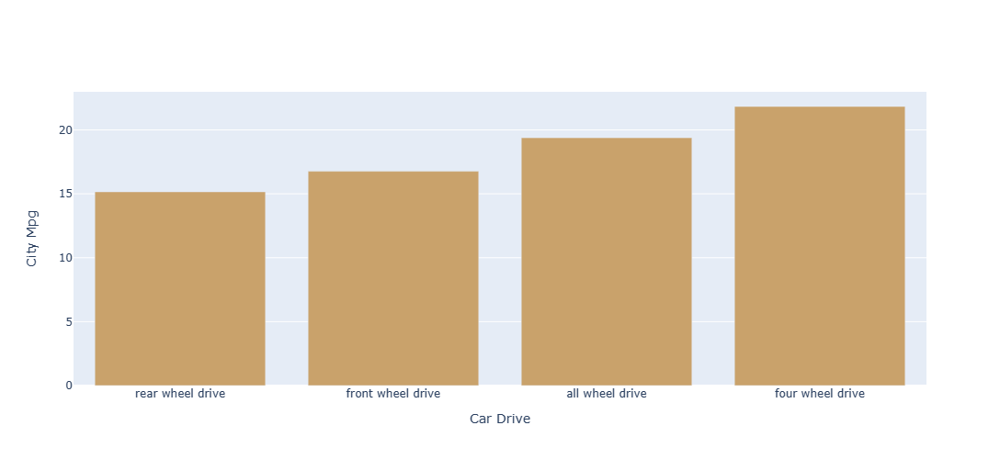

In [143]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Drive'].unique(), y = df.groupby('Drive')['City MPG'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Drive", yaxis_title = "City Mpg", width = 700, height = 500)

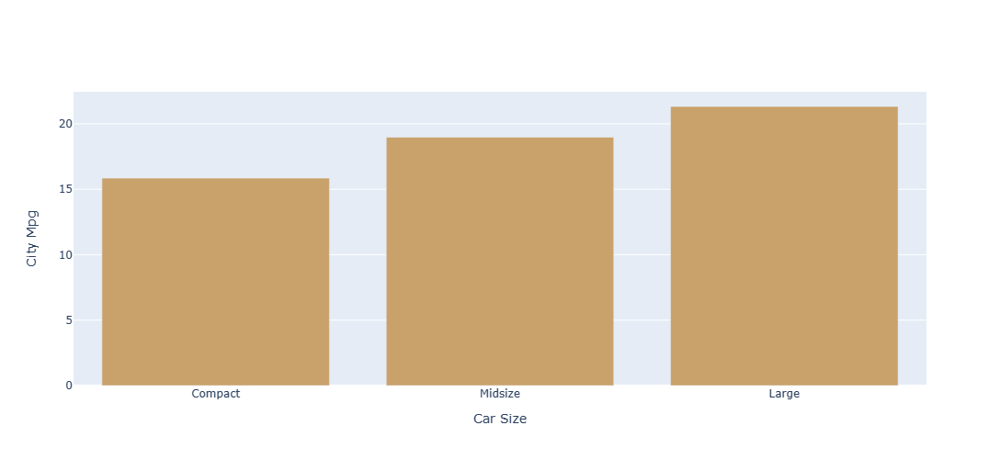

In [144]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Size'].unique(), y = df.groupby('Size')['City MPG'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Size", yaxis_title = "City Mpg", width = 700, height = 500)

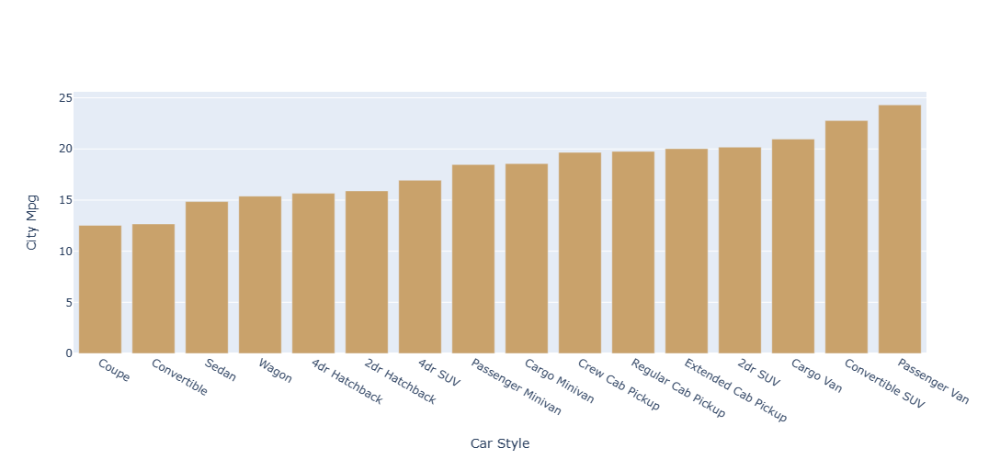

In [145]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Style'].unique(), y = df.groupby('Style')['City MPG'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Style", yaxis_title = "City Mpg", width = 700, height = 500)

- Make: The car brand of Chrysler has the highest city mpg of 16.6.
- Model: The car model of 190-Class and some others has the highest city mpg of 11.
- Fuel: The car fuel type of Diesel has the highest city mpg of 18.5.
- Transmission: Car transmission of Manual has the lowest city mpg of 18.6 and car transmission of Automated-Manual has the highest city mpg of 23.8.
- Drive: Car drive of Rear wheel drive has the lowest city mpg of 15.1 and car drive of Four wheel drive has the highest city mpg of 21.8.
- Size: Car size of Compact has the lowest city mpg of 15.8 and car size of Large has the highest city mpg of 21.3.
- Style: Car style of Coupe has the lowest city mpg of 12.5 and car style of Passenger Van has the highest city mpg of 24.3.

According to Highway MPG

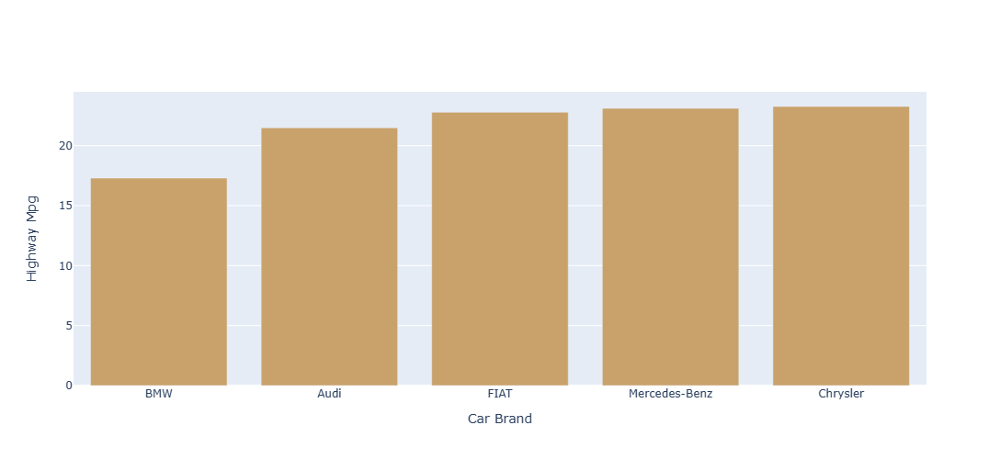

In [146]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Make'].unique(), y = df.groupby('Make')['Highway MPG'].mean().sort_values()[:5], marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Brand", yaxis_title = "Highway Mpg", width = 700, height = 500)

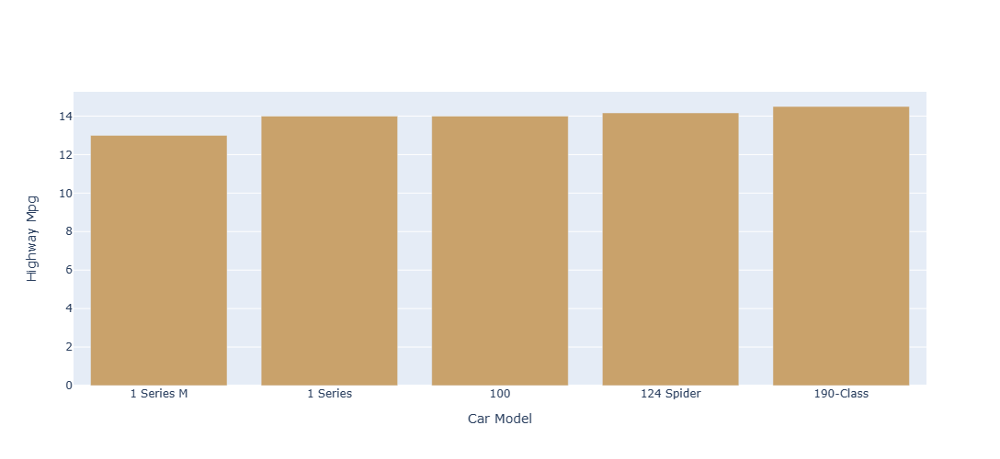

In [147]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Model'].unique(), y = df.groupby('Model')['Highway MPG'].mean().sort_values()[:5], marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Model", yaxis_title = "Highway Mpg", width = 700, height = 500)

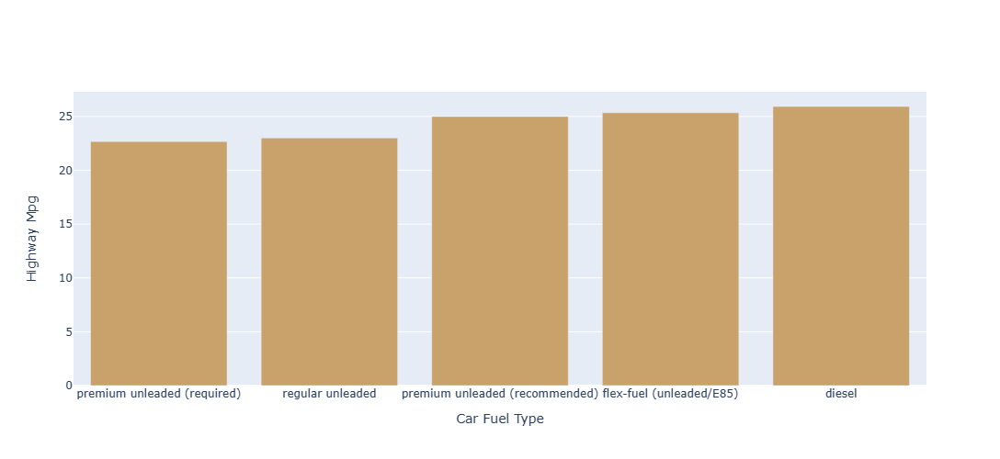

In [148]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Fuel'].unique(), y = df.groupby('Fuel')['Highway MPG'].mean().sort_values()[:5], marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Fuel Type", yaxis_title = "Highway Mpg", width = 700, height = 500)

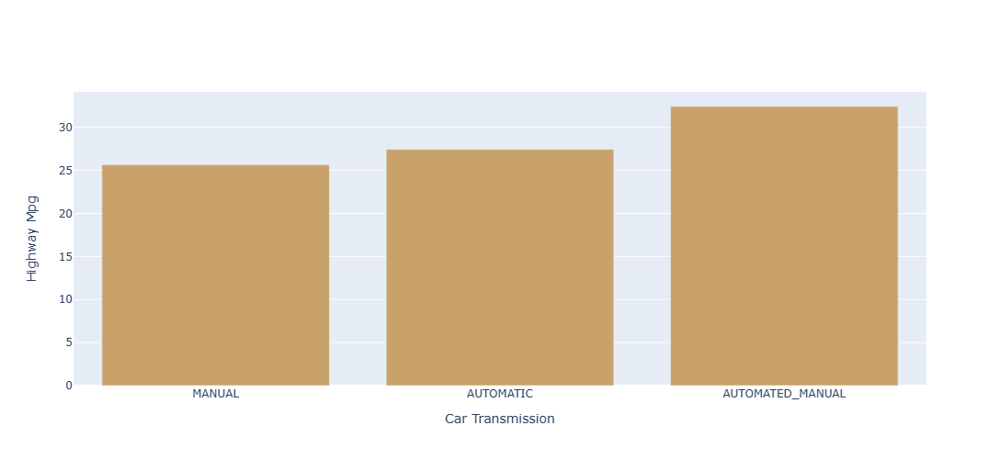

In [149]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Transmission'].unique(), y = df.groupby('Transmission')['Highway MPG'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Transmission", yaxis_title = "Highway Mpg", width = 700, height = 500)

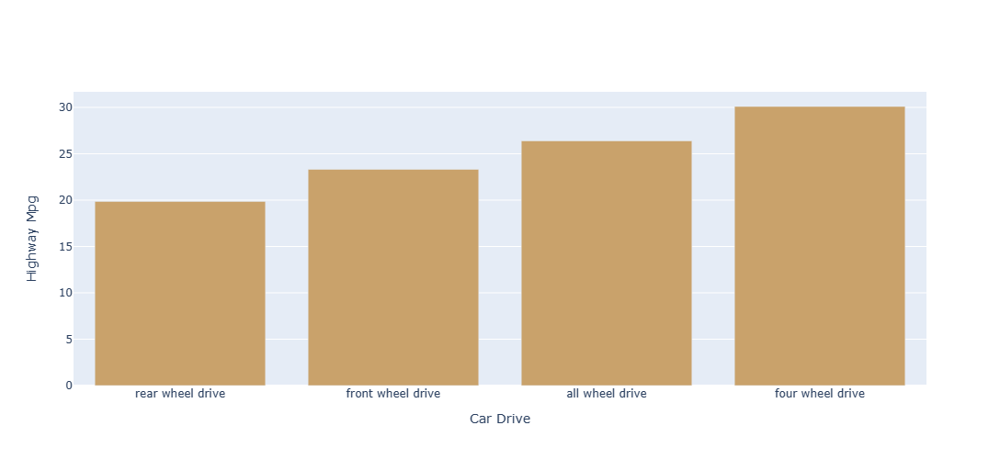

In [150]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Drive'].unique(), y = df.groupby('Drive')['Highway MPG'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Drive", yaxis_title = "Highway Mpg", width = 700, height = 500)

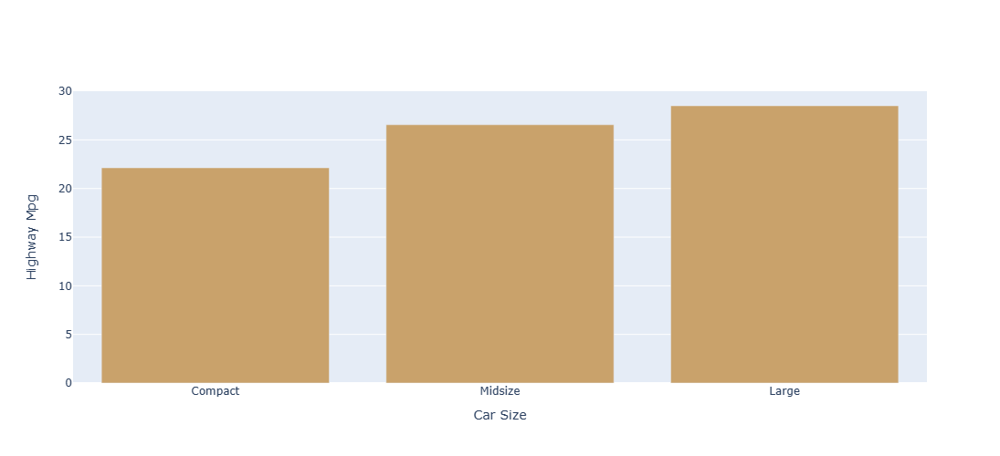

In [151]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Size'].unique(), y = df.groupby('Size')['Highway MPG'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Size", yaxis_title = "Highway Mpg", width = 700, height = 500)

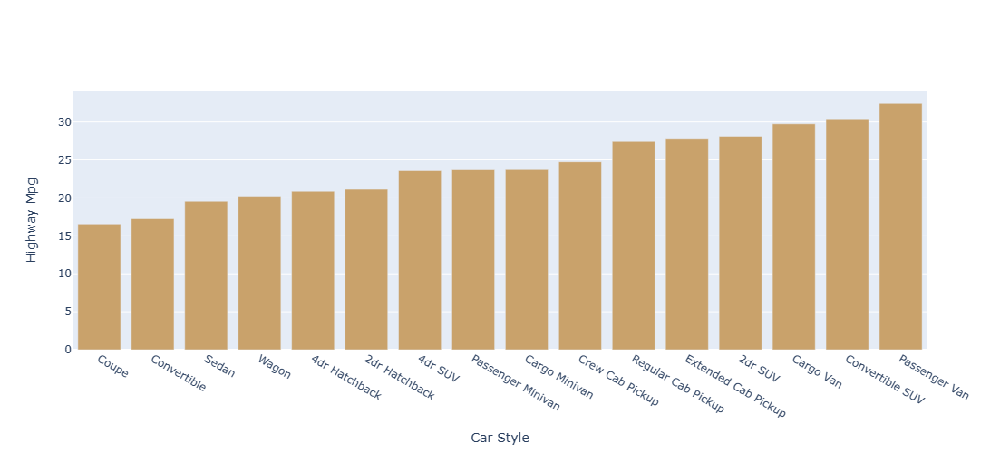

In [152]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Style'].unique(), y = df.groupby('Style')['Highway MPG'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Style", yaxis_title = "Highway Mpg", width = 700, height = 500)

- Make: The car brand of Chrysler has the highest highay mpg of 23.2.
- Model: The car model of 190-Class has the highest highay mpg of 14.5.
- Fuel: The car fuel type of Diesel has the highest highay mpg of 25.9.
- Transmission: Car transmission of Manual has the lowest highay mpg of 25.6 and car transmission of Automated-Manual has the highest highay mpg of 32.4.
- Drive: Car drive of Rear wheel drive has the lowest highay mpg of 19.8 and car drive of Four wheel drive has the highest highay mpg of 30.
- Size: Car size of Compact has the lowest highay mpg of 22.1 and car size of Large has the highest highay mpg of 28.5.
- Style: Car style of Coupe has the lowest highay mpg of 16.5 and car style of Passenger Van has the highest highay mpg of 32.4.

According to Price

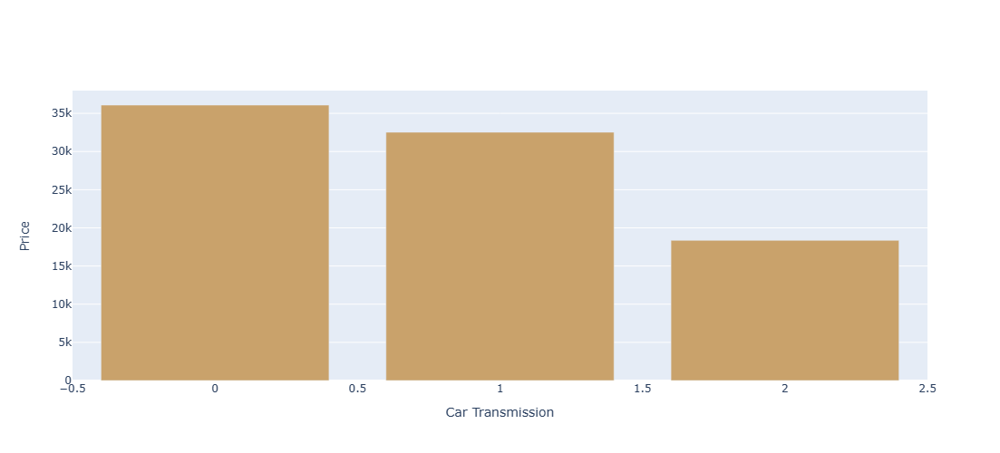

In [182]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Transmission'].unique(), y = df.groupby('Transmission')['Price'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(xaxis_title = "Car Transmission", yaxis_title = "Price", width = 700, height = 500)

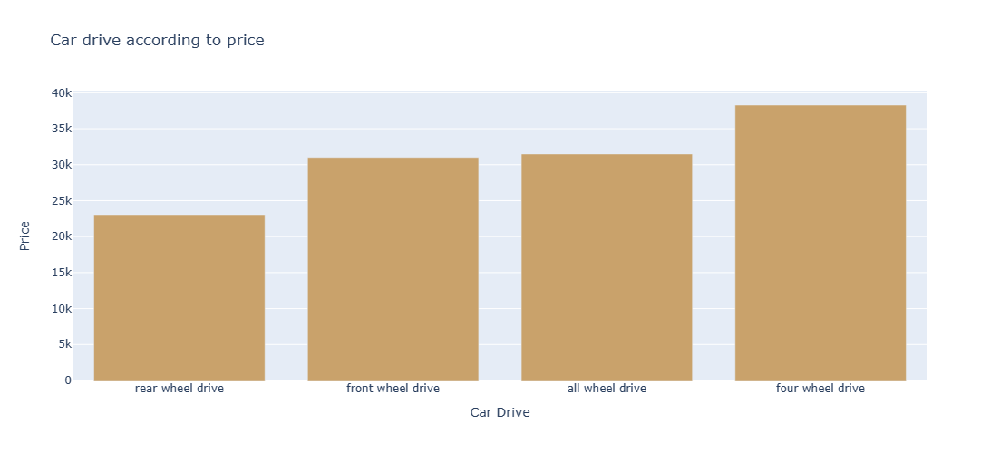

In [157]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Drive'].unique(), y = df.groupby('Drive')['Price'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(title_text = 'Car drive according to price', xaxis_title = "Car Drive", yaxis_title = "Price", width = 700, height = 500)

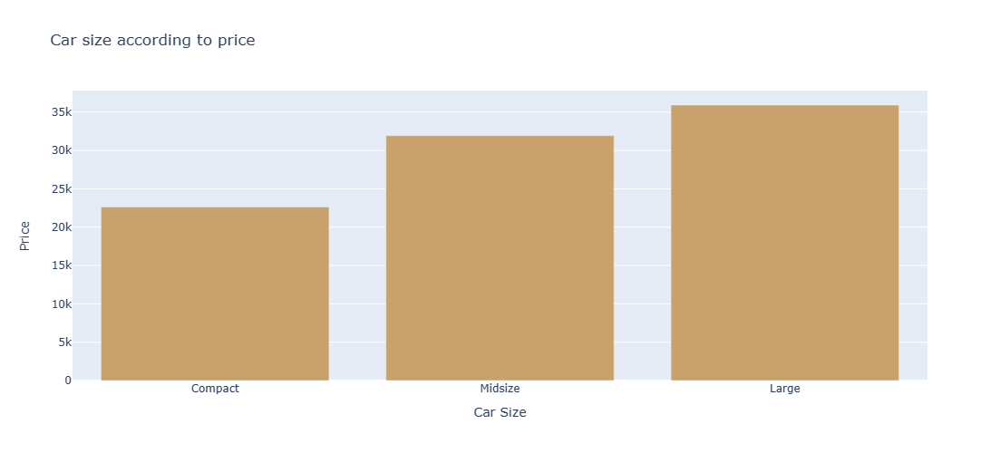

In [158]:
fig = go.Figure()
fig.add_trace(go.Bar(x = df['Size'].unique(), y = df.groupby('Size')['Price'].mean().sort_values(), marker_color = '#C9A26B'))
fig.update_layout(title_text = 'Car size according to price', xaxis_title = "Car Size", yaxis_title = "Price", width = 700, height = 500)

- Make: The car brand of Chrysler has the highest pricec of around 20K.    
- Model: Expensive car models like 190-Class and some others has the highest prices of around 2000.
- Fuel: Cars that use fuel type of Diesel has highest prices of around 39.1K.
- Transmission: Car transmission of Manual has prices around 18.3K and car transmission of Automated-Manual has the prices around 36K.
- Drive: Car drive of Rear wheel drive has the prices around 23K and car drive of Four wheel drive has the prices around 38.2K.
- Size: Compact car sizes has prices around 22.6K and car size of Large has prices around of 35.9K.
- Style: Car style of Coupe has prices around 14.8K and car style of Passenger Van has the prices around 37.1K.

Relation between price and numerical variables

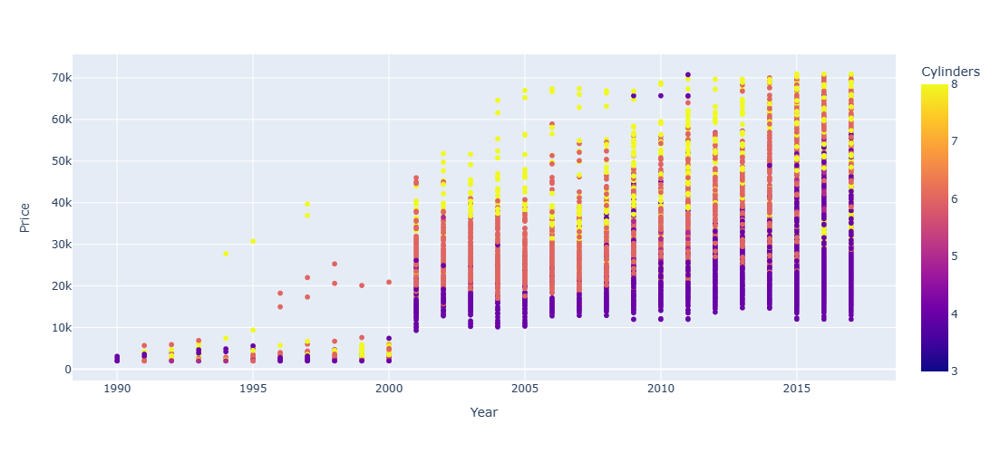

In [160]:
# Scatter Plot Distribution
fig = px.scatter(df, x = 'Year', y = 'Price', color = 'Cylinders')
fig.update_layout(width = 900, height = 500)
fig.show()

The amount of cylinders being used in cars have increased from year 2001. In year 2015, 2016 and 2017, it can be observed that most of the cars are using 4 number of cylinders.
It can also be seen that the car prices have rapidly increased in 2001. They were low in previous years. Furthermore, the prices kept increasing since year 2001.

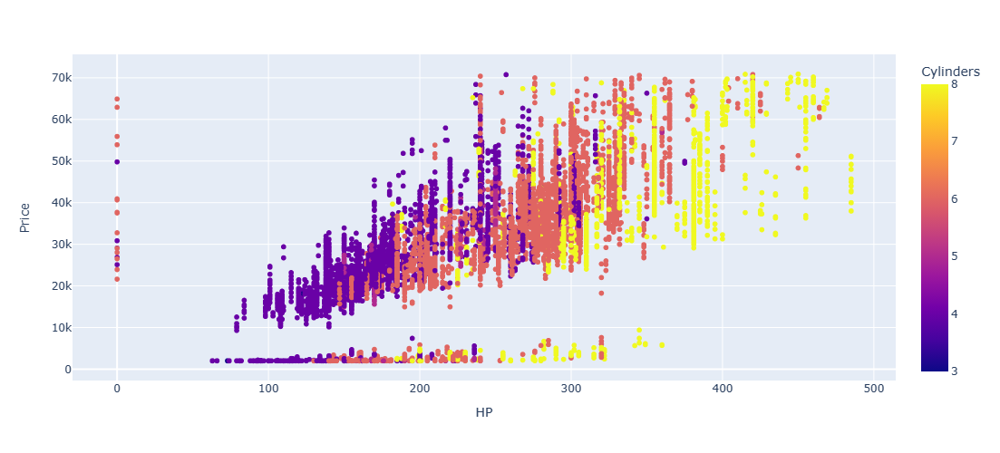

In [161]:
fig = px.scatter(df, x = 'HP', y = 'Price', color = 'Cylinders')
fig.update_layout(width = 900, height = 500)
fig.show()

There is a positive relation between HP and Price. As the HP increases, the car price also increases.
As the hp increases more than 290, most of the cars are likely to have 8 cylinders.
Cars having hp less than 180 are more likely to have 4 cylinders.

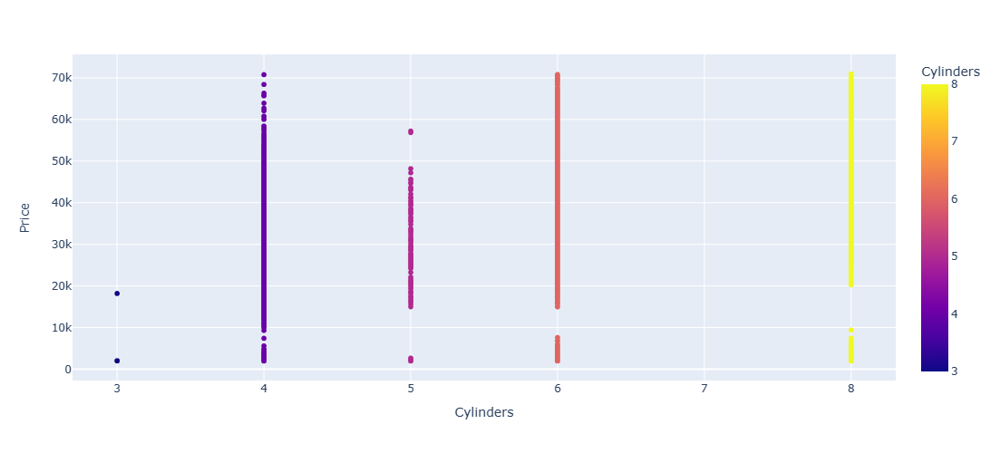

In [162]:
fig = px.scatter(df, x = 'Cylinders', y = 'Price', color = 'Cylinders')
fig.update_layout(width = 900, height = 500)
fig.show()

The price of 4, 6 and 8 number of cylinders can be as low as 2000 and as high as 70K.

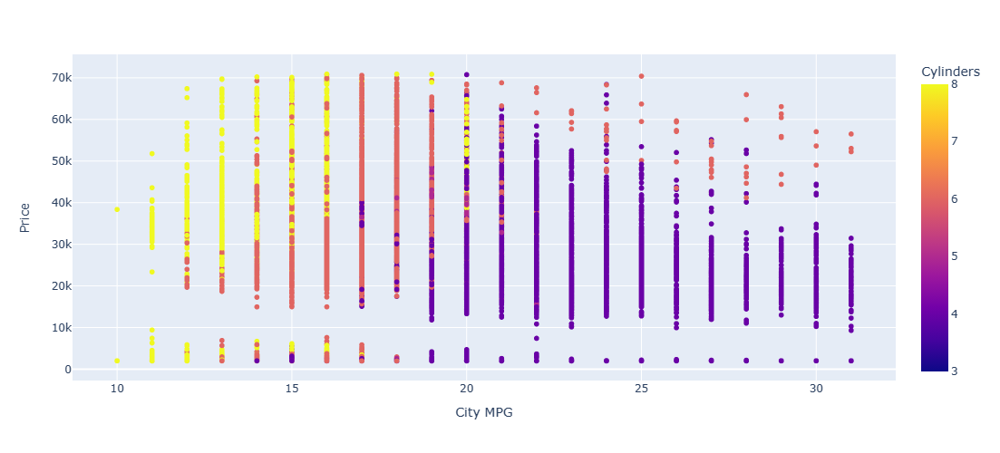

In [163]:
fig = px.scatter(df, x = 'City MPG', y = 'Price', color = 'Cylinders')
fig.update_layout(width = 900, height = 500)
fig.show()

Cars that are giving a city mpg of 10 and 11 have only 8 cylinders.
Cars that are giving a city mpg of 17 have mostly 6 cylinders.
Cars with 4 cylinders have a really good mpg inside a city.

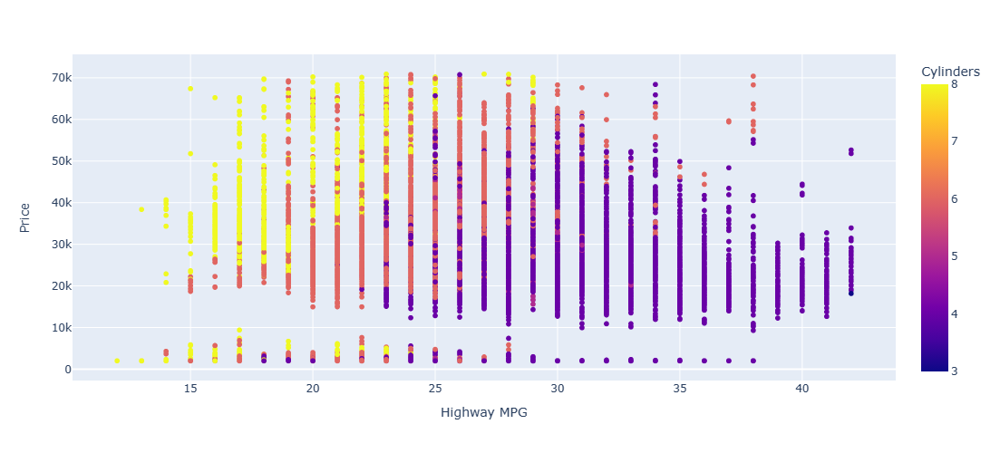

In [164]:
fig = px.scatter(df, x = 'Highway MPG', y = 'Price', color = 'Cylinders')
fig.update_layout(width = 900, height = 500)
fig.show()

Cars that are giving a highway mpg of 12, 13, 14, 15, 16, 17 and 18 have mostly 8 cylinders.
Cars that are giving a highway mpg from 19 to 27 have mostly 6 cylinders.
Cars giving a highway mpg 28 or more than 28 have mostly 4 cylinder0K.

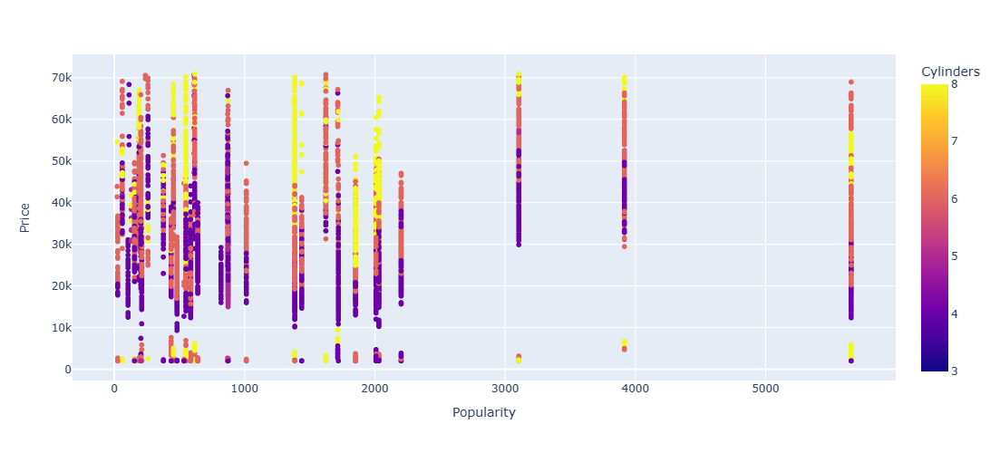

In [165]:
fig = px.scatter(df, x = 'Popularity', y = 'Price', color = 'Cylinders')
fig.update_layout(width = 900, height = 500)
fig.show()

Most of the cars having popularity of 204 with 6 cylinders have prices starting 35K and goes as high as 57K while those having popularity of 549 with 8 cylinders have prices starting from 42K and goes as high as 70.2K.
Cars having popularity of 1385 and 8 cylinders have prices higher than 44K while popularity of 5657 and prices above than 21K are more likely to have 6 cylinders.

# Model Training and Evaluation

In [166]:
# Converting the Categorical features into numerical for Model Building
label_encoder = LabelEncoder()

df['Make'] = label_encoder.fit_transform(df['Make'])
df['Model'] = label_encoder.fit_transform(df['Model'])
df['Fuel'] = label_encoder.fit_transform(df['Fuel'])
df['Transmission'] = label_encoder.fit_transform(df['Transmission'])
df['Drive'] = label_encoder.fit_transform(df['Drive'])
df['Size'] = label_encoder.fit_transform(df['Size'])
df['Style'] = label_encoder.fit_transform(df['Style'])

In [167]:
df

,Make,Model,Year,Fuel,HP,Cylinders,Transmission,Drive,Doors,Size,Style,Highway MPG,City MPG,Popularity,Price
0,3,1,2011,7,335.0,6.0,2,3,2.0,0,8,26,19,3916,46135
1,3,0,2011,7,300.0,6.0,2,3,2.0,0,6,28,19,3916,40650
2,3,0,2011,7,300.0,6.0,2,3,2.0,0,8,28,20,3916,36350
3,3,0,2011,7,230.0,6.0,2,3,2.0,0,8,28,18,3916,29450
4,3,0,2011,7,230.0,6.0,2,3,2.0,0,6,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11909,0,732,2012,7,300.0,6.0,1,0,4.0,2,2,23,16,204,46120
11910,0,732,2012,7,300.0,6.0,1,0,4.0,2,2,23,16,204,56670
11911,0,732,2012,7,300.0,6.0,1,0,4.0,2,2,23,16,204,50620
11912,0,732,2013,6,300.0,6.0,1,0,4.0,2,2,23,16,204,50920


In [168]:
# Calculate the correlation between all feature columns and the target column
correlation = df.corr()['Price'].sort_values(ascending=False)

# Convert correlation series to DataFrame for better visualization
correlation_df = pd.DataFrame(correlation, columns=['Price'])

# Print the correlation DataFrame
print(correlation_df)

                 Price
Price         1.000000
HP            0.730046
Year          0.682532
Cylinders     0.326372
Size          0.263269
Doors         0.191287
Model         0.073429
Popularity    0.036119
Style        -0.061313
Highway MPG  -0.068093
City MPG     -0.139169
Make         -0.175092
Drive        -0.206646
Fuel         -0.314197
Transmission -0.380404


In [169]:
# Covnerying the feature columns into category 
columns_to_convert=['Make', 'Model', 'Fuel', 'Transmission', 'Drive', 'Size', 'Style']
df[columns_to_convert] = df[columns_to_convert].astype('category')

In [170]:
# Checking the datatypes
df.dtypes

Make            category
Model           category
Year               int64
Fuel            category
HP               float64
Cylinders        float64
Transmission    category
Drive           category
Doors            float64
Size            category
Style           category
Highway MPG        int64
City MPG           int64
Popularity         int64
Price              int64
dtype: object

In [171]:
# Encoding the features 
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
  
# Encode labels in column 'species'.
for col in ['Make','Model','Fuel','Transmission','Drive','Size','Style']: df[col] = label_encoder.fit_transform(df[col])

In [172]:
df.head()

,Make,Model,Year,Fuel,HP,Cylinders,Transmission,Drive,Doors,Size,Style,Highway MPG,City MPG,Popularity,Price
0,3,1,2011,7,335.0,6.0,2,3,2.0,0,8,26,19,3916,46135
1,3,0,2011,7,300.0,6.0,2,3,2.0,0,6,28,19,3916,40650
2,3,0,2011,7,300.0,6.0,2,3,2.0,0,8,28,20,3916,36350
3,3,0,2011,7,230.0,6.0,2,3,2.0,0,8,28,18,3916,29450
4,3,0,2011,7,230.0,6.0,2,3,2.0,0,6,28,18,3916,34500


In [173]:
# Defining the x and y data
x = df[['Popularity','Year','HP','Cylinders','Highway MPG','City MPG']].values
y = df['Price'].values

print(x.shape)
print(y.shape)

(9784, 6)
(9784,)


In [174]:
# Scaling and transforming the x any y data
sc_x = StandardScaler()
sc_y = StandardScaler()

x = sc_x.fit_transform(x)
y = sc_y.fit_transform(y.reshape(-1,1))

Splitting the dataset:
Typically,we separate a data set into a training set and testing set, most of the data is used for training, and a smaller portion of the data is used for testing. Analysis Services randomly samples the data to help ensure that the testing and training sets are similar.

In [175]:
# Splitting the train and test data
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(7827, 6)
(7827, 1)
(1957, 6)
(1957, 1)


Evaluation Metrics:
Algorithm: Linear Regression
Accuracy: 0.7178107714076747
Mean Absolute Error: 0.4056835409385999
Mean Squared Error: 0.28160808235182594



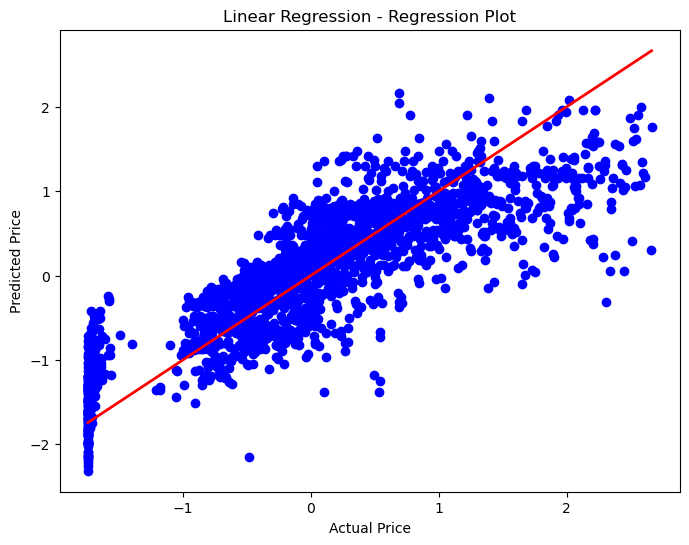

Evaluation Metrics:
Algorithm: Ridge Regression
Accuracy: 0.7178054528468945
Mean Absolute Error: 0.4056859751739068
Mean Squared Error: 0.28161338995945384



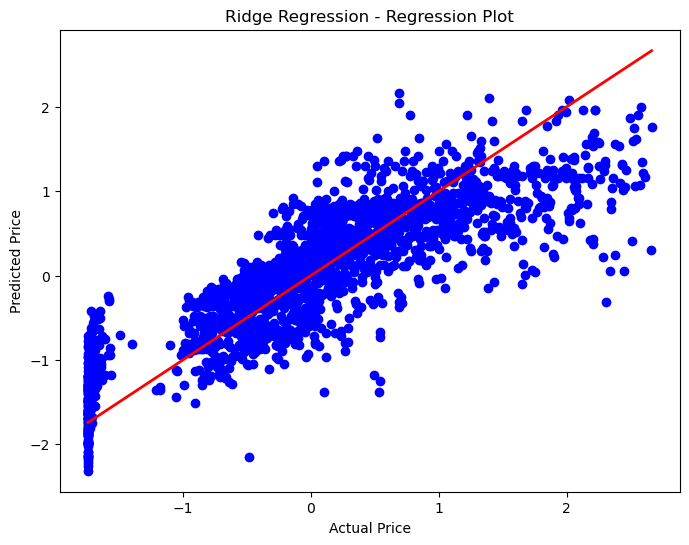

Evaluation Metrics:
Algorithm: Lasso Regression
Accuracy: -0.005576613153646992
Mean Absolute Error: 0.7741480280127836
Mean Squared Error: 1.0035057082109478



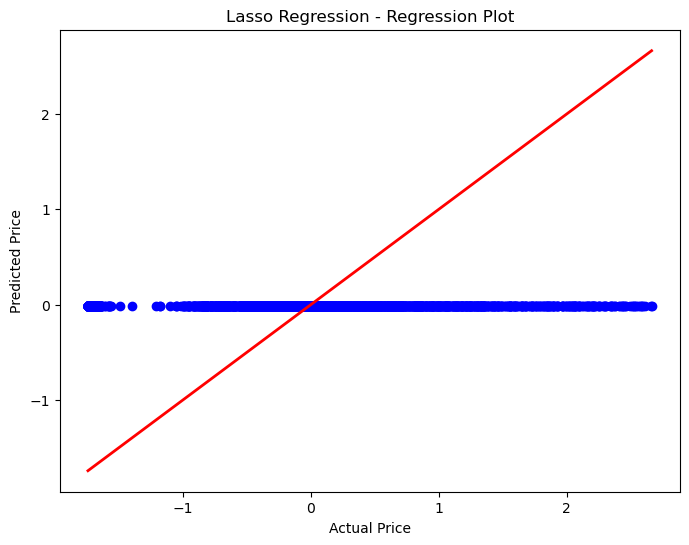

Evaluation Metrics:
Algorithm: Decision Tree Regressor
Accuracy: 0.9194380381353875
Mean Absolute Error: 0.1889415628973391
Mean Squared Error: 0.08039605092074541



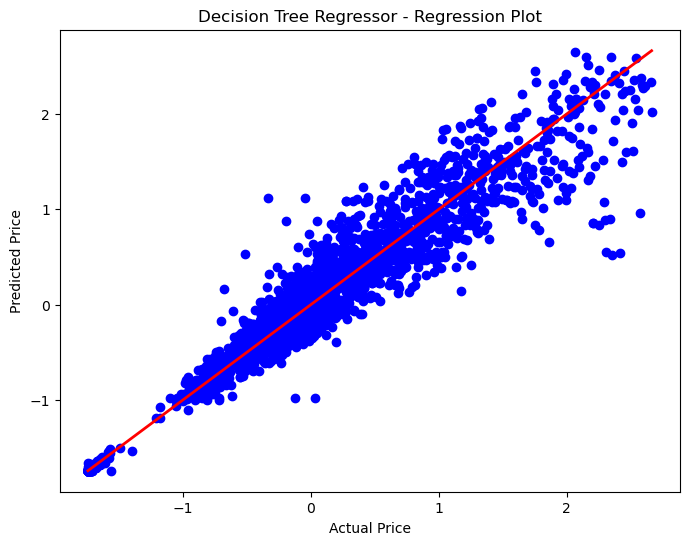

Evaluation Metrics:
Algorithm: Random Forest Regressor
Accuracy: 0.9298758737644793
Mean Absolute Error: 0.17963029038149222
Mean Squared Error: 0.06997971118277978



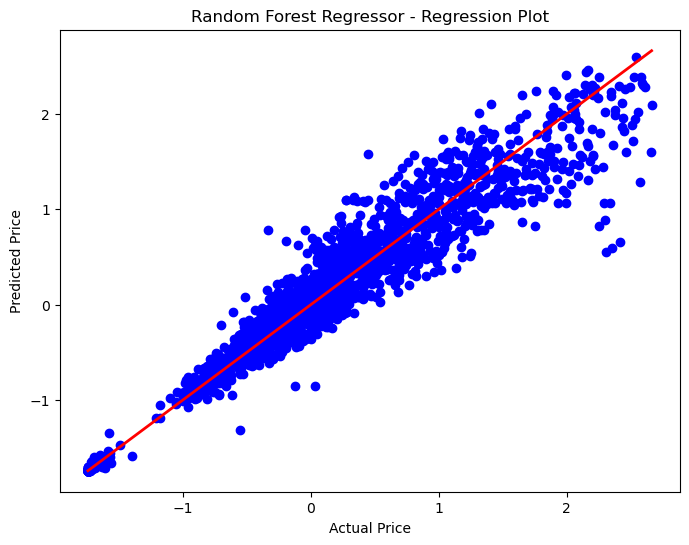

Evaluation Metrics:
Algorithm: Gradient Boosting Regressor
Accuracy: 0.8852091420218824
Mean Absolute Error: 0.23896384399583723
Mean Squared Error: 0.11455445534896534



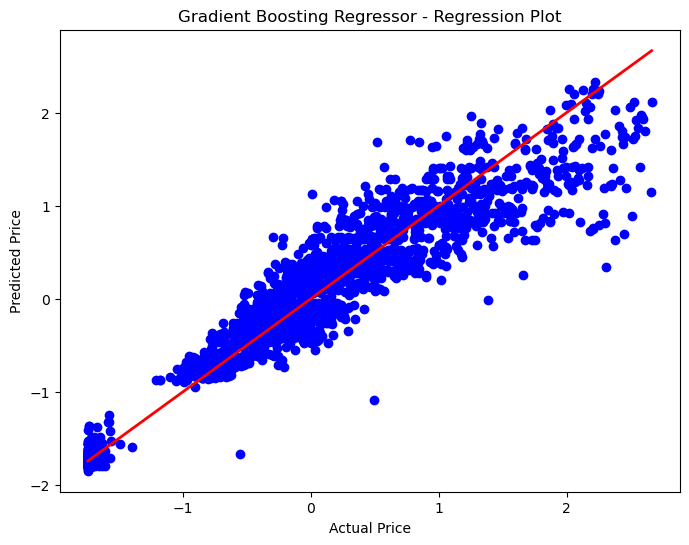

Evaluation Metrics:
Algorithm: K Neighbor Regressor
Accuracy: 0.9045843754824172
Mean Absolute Error: 0.20493127520990792
Mean Squared Error: 0.09521912363854529



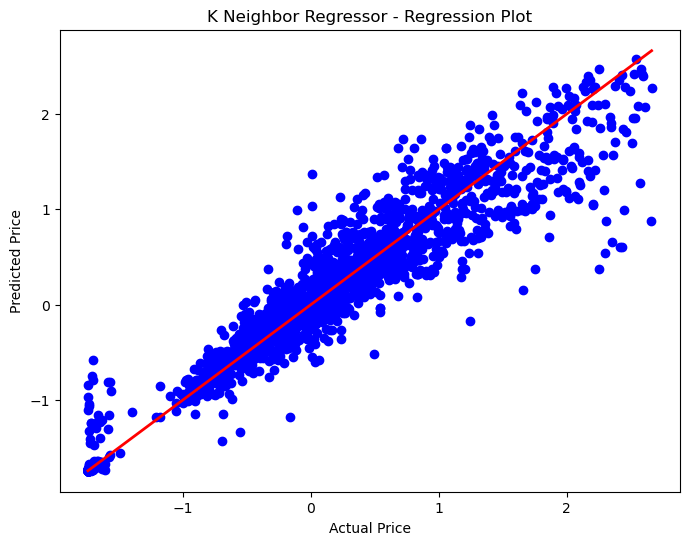

In [176]:
# Define models to iterate over
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(),
    "Lasso Regression": Lasso(),
    "Decision Tree Regressor": DecisionTreeRegressor(),
    "Random Forest Regressor": RandomForestRegressor(),
    "Gradient Boosting Regressor": GradientBoostingRegressor(),
    "K Neighbor Regressor": KNeighborsRegressor()
}

# Results table
results = []

# Iterate over models
for name, model in models.items():
    # Fit model
    model.fit(x_train, y_train)
    
    # Make predictions
    y_pred = model.predict(x_test)
    
    # Calculate evaluation metrics
    accuracy = model.score(x_test, y_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

    
    # Print or store the evaluation metrics
    print(f"Evaluation Metrics:")
    print(f"Algorithm: {name}")
    print(f"Accuracy: {accuracy}")
    print(f"Mean Absolute Error: {mae}")
    print(f"Mean Squared Error: {mse}")
    print()
    
    
    # Append results to table
    results.append([name, accuracy, mae, mse])
    
    # Plot regression
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred, color='blue')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2)
    plt.xlabel('Actual Price')
    plt.ylabel('Predicted Price')
    plt.title(f'{name} - Regression Plot')
    plt.show()



In [177]:
# Display results table 
print("\033[1m" + "{:<30} {:<15} {:<15} {:<15}".format("Model", "Accuracy", "MAE", "MSE") + "\033[0m")
for row in results:
    print("{:<30} {:<15.2f} {:<15.2f} {:<15.2f}".format(row[0], row[1], row[2], row[3]))

Model                          Accuracy        MAE             MSE            
Linear Regression              0.72            0.41            0.28           
Ridge Regression               0.72            0.41            0.28           
Lasso Regression               -0.01           0.77            1.00           
Decision Tree Regressor        0.92            0.19            0.08           
Random Forest Regressor        0.93            0.18            0.07           
Gradient Boosting Regressor    0.89            0.24            0.11           
K Neighbor Regressor           0.90            0.20            0.10           


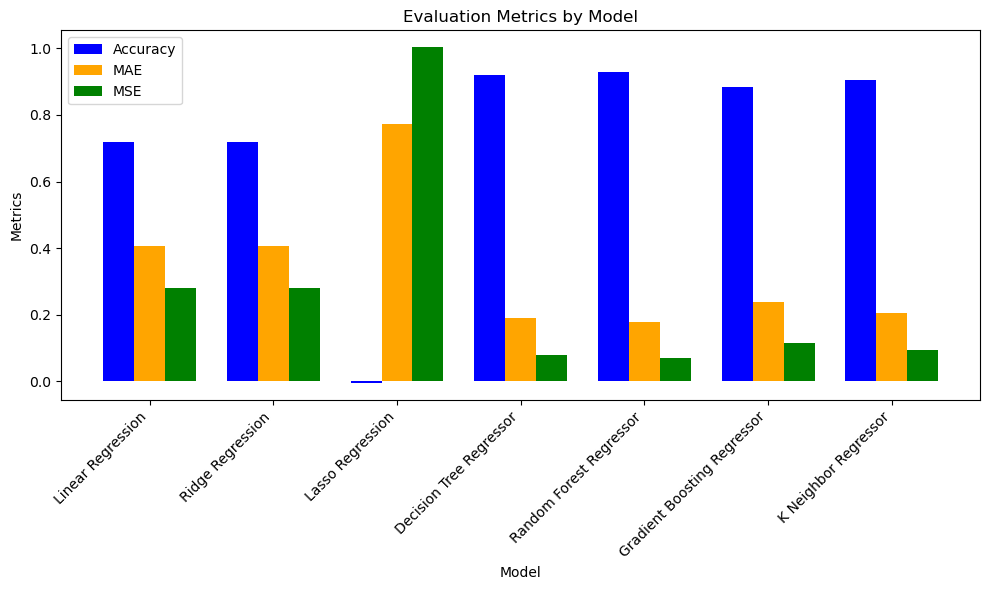

In [178]:
# Extract model names and evaluation metrics
models = [row[0] for row in results]
accuracies = [row[1] for row in results]
maes = [row[2] for row in results]
mses = [row[3] for row in results]

# Set up figure and axis
plt.figure(figsize=(10, 6))
x = np.arange(len(models))
width = 0.25

# Plot bars for accuracy, MAE, and MSE
plt.bar(x - width, accuracies, width, label='Accuracy', color='blue')
plt.bar(x, maes, width, label='MAE', color='orange')
plt.bar(x + width, mses, width, label='MSE', color='green')

# Add labels and title
plt.xlabel('Model')
plt.ylabel('Metrics')
plt.title('Evaluation Metrics by Model')
plt.xticks(x, models, rotation=45, ha='right')
plt.legend()

# Show plot
plt.tight_layout()
plt.show()

# Conclusion

- It is evident that the Random Forest Regressor has the lowest Mean Absolute Error and a high accuracy score. Lasso Regression has a very high Mean Squared Error. Therefore, it would be inappropriate to use that model for car prices prediction. However, the same model might perform the best for other tasks. Therefore, we should explore many models before deploying them in real-time.

- In terms of the Mean Squared Error, we see Random Forest Regressor is performing well. But we stick with Mean Absolute Error as a metric for our deployment as it is also interpretable. Thus, we would be using Random Forest RegressorRegressor for deploying in real-time to predict future prices of various cars based on the features such as HP, MPG, Cylinders etc.

- Iterating through multiple models and computing various evaluation metrics such as accuracy, mean absolute error (MAE), and mean squared error (MSE), we gain insights into the performance of each algorithm.

- The evaluation metrics table provides a clear summary of the performance of each model. This enables to quickly compare the performance of different algorithms and make informed decisions. Additionally, the bar plot presentation offers a visual representation of the evaluation metrics, making it easier to identify trends and differences between models. Each bar represents a different evaluation metric, and the colors help distinguish between them.

- The comprehensive evaluation enabled to select the most suitable machine learning algorithm for the price prediction task based on the specific requirements and priorities.